In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer , TfidfVectorizer
import datetime as dt
import re
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
#%matplotlib inline 
from pandas.core.frame import DataFrame
from bokeh.charts import Bar


In [ ]:

import image
import os
import glob
  
dir="f:\mobile"
#取出指定文件
file=glob.glob(os.path.join(dir,'xxx.JPG'))
  
#打开图片
img = image.open(file)
  
#显示图片
img.show()
print img.format, img.size, img.mode
print " rotating image....."
im=img.rotate(90)
im.save(image)

In [2]:
data = pd.read_csv("E:/hotel3.csv",encoding='utf-8')
print('Data Size', data.shape)

Data Size (34808, 8)


In [3]:
data.dtypes

latitude            float64
longitude           float64
name                 object
province             object
reviews.date         object
reviews.rating      float64
reviews.text         object
reviews.username     object
dtype: object

In [4]:
#Filter out ratings that are zero
data = data[data['reviews.rating']>0]

#Renaming column names that have a '.' in them
data = data.rename(index=str, columns={'reviews.date':'reviewsdate','reviews.rating':'reviewsrating', 
                                       'reviews.text':'reviewstext','reviews.username':'reviewsusername'})

#data.reviewstext = data.reviewstext.fillna('x')

#A few hundred ratings had a score above 5, filtering these out
data = data[data['reviewsrating']<=5]
#A few hundred ratings had decimals, rounding each of those down to an integer
data.reviewsrating = data.reviewsrating.astype(int)

In [5]:
print('Data Size', data.shape)

Data Size (34118, 8)


In [6]:
data.dtypes

latitude           float64
longitude          float64
name                object
province            object
reviewsdate         object
reviewsrating        int32
reviewstext         object
reviewsusername     object
dtype: object

In [7]:
data.head()

,latitude,longitude,name,province,reviewsdate,reviewsrating,reviewstext,reviewsusername
0,45.421611,12.376187,Hotel Russo Palace,GA,2013-09-22T00:00:00Z,4,Pleasant 10 min walk along the sea front to th...,Russ (kent)
1,45.421611,12.376187,Hotel Russo Palace,GA,2015-04-03T00:00:00Z,5,Really lovely hotel. Stayed on the very top fl...,A Traveler
2,45.421611,12.376187,Hotel Russo Palace,GA,2013-10-27T00:00:00Z,5,We stayed here for four nights in October. The...,Julie
3,45.421611,12.376187,Hotel Russo Palace,GA,2015-03-05T00:00:00Z,5,We stayed here for four nights in October. The...,NaN
4,45.421611,12.376187,Hotel Russo Palace,GA,2015-04-05T00:00:00Z,5,We loved staying on the island of Lido! You ne...,A Traveler


In [8]:
data.isnull().sum()

latitude           72
longitude          72
name                0
province            0
reviewsdate         0
reviewsrating       0
reviewstext         5
reviewsusername    69
dtype: int64

In [9]:
data = data.dropna()

In [10]:
data.isnull().sum()

latitude           0
longitude          0
name               0
province           0
reviewsdate        0
reviewsrating      0
reviewstext        0
reviewsusername    0
dtype: int64

In [11]:
data.shape

(33972, 8)

In [12]:
data.columns.values.tolist()

['latitude',
 'longitude',
 'name',
 'province',
 'reviewsdate',
 'reviewsrating',
 'reviewstext',
 'reviewsusername']

In [13]:
data.rename(columns={'\ufefflatitude':'latitude'}, inplace = True)

In [14]:
data.shape

(33972, 8)

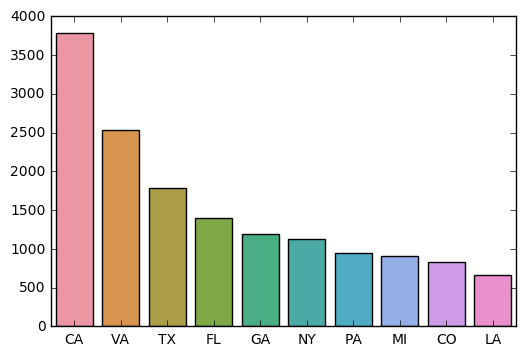

In [12]:
province = data['province'].value_counts()
province_top = province[:10]
sns.barplot(province_top.index,province_top.values)
plt.show()

In [132]:
#### 各酒店的评论数
hotel_name = data['name'].value_counts()
tophotel=hotel_name[:20].index
print(hotel_name[:20])


The Alexandrian, Autograph Collection                 1122
Howard Johnson Inn - Newburgh                          664
Americas Best Value Inn                                559
Fiesta Inn and Suites                                  546
Ip Casino Resort Spa                                   389
Comfort Suites                                         326
Best Western of Long Beach                             317
Best Western Plus Waterville Grand Hotel               314
Plaza Hotel and Casino - Las Vegas                     289
Anaheim Marriott Suites                                275
Doubletree By Hilton West Palm Beach Airport           274
Jacksonville Plaza Hotel and Suites                    264
Hotel Deca - A Noble House Hotel                       237
Red Roof Inn Erie                                      233
Hampton Inn Virginia Beach Oceanfront North            225
Doubletree By Hilton Hotel Bay City - Riverfront       225
New York Marriott Marquis                              2

In [14]:
### 各酒店的平均评分


#print(np.mean(data[data['name']=='The Alexandrian, Autograph Collection']['reviews.rating']))

allmean=data['reviewsrating'].groupby(data['name']).mean()
topmean=allmean[tophotel]


In [199]:
#data[data['name']=="1785 Innn"]['name'].value_counts()


#hotel_name.index == "Holiday Inn Express - Harrisburg East"
#hotel_name[62]
allmean['Mccamly Plaza Hotel']


3.5764705882352943

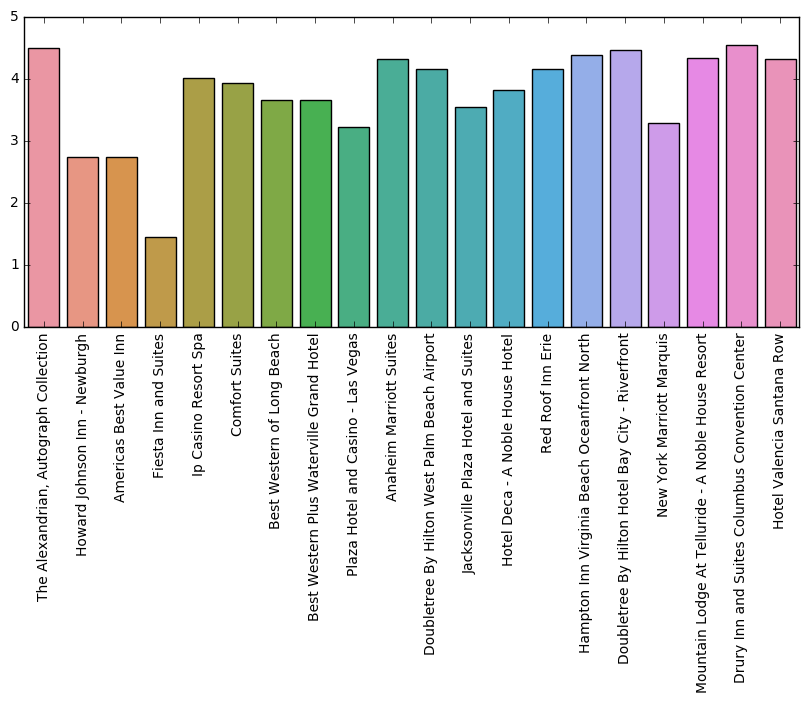

In [15]:
plt.figure(figsize=(10,4))
sns.barplot(topmean.index, topmean.values)
#plt.ylabel("Number Of Review")
#plt.xlabel("Average Order By Days")
plt.xticks(rotation=90)
plt.show()


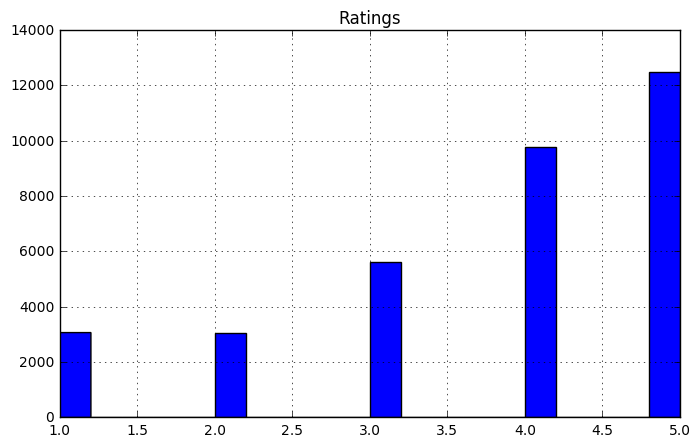

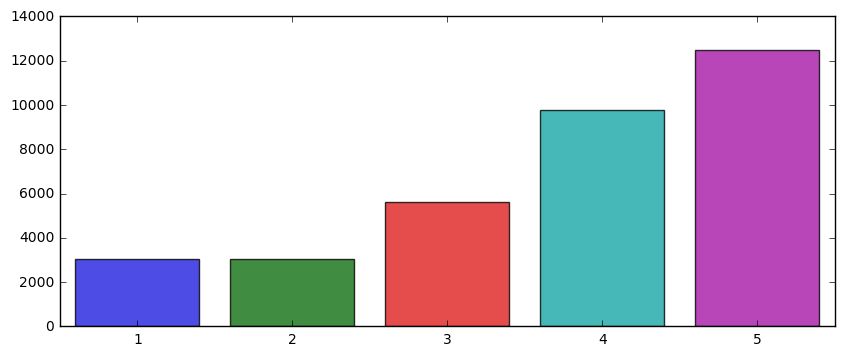

In [16]:
### 评分的分布情况

plt.rcParams['figure.figsize'] = (8, 5.0)
scores = pd.DataFrame({"Ratings":data["reviewsrating"]})
scores.hist(bins=20)

plt.figure(figsize=(10,4))
sns.barplot(data['reviewsrating'].value_counts().index, data['reviewsrating'].value_counts().values, alpha=0.8)
#plt.ylabel("Number Of Review")
#plt.xlabel("Average Order By Days")
plt.show()


sns.set(style="darkgrid")
ax = sns.countplot(x="reviewsrating", data=data)

In [120]:
data['reviewsrating'].value_counts()

5    12475
4     9754
3     5625
1     3066
2     3052
Name: reviewsrating, dtype: int64

In [15]:
data['Date'] = pd.to_datetime(data['reviewsdate'], errors='coerce')
data['new_date'] = [d.date() for d in data['Date']]
data['new_time'] = [d.time() for d in data['Date']]
data['day'] = pd.DatetimeIndex(data['new_date']).day 
data['month'] = pd.DatetimeIndex(data['new_date']).month
data['year'] = pd.DatetimeIndex(data['new_date']).year 
data = data.drop(['Date'],axis=1)

In [18]:
data.head()

,latitude,longitude,name,province,reviewsdate,reviewsrating,reviewstext,reviewsusername,new_date,new_time,day,month,year
0,45.421611,12.376187,Hotel Russo Palace,GA,2013-09-22T00:00:00Z,4,Pleasant 10 min walk along the sea front to th...,Russ (kent),2013-09-22,00:00:00,22,9,2013
1,45.421611,12.376187,Hotel Russo Palace,GA,2015-04-03T00:00:00Z,5,Really lovely hotel. Stayed on the very top fl...,A Traveler,2015-04-03,00:00:00,3,4,2015
2,45.421611,12.376187,Hotel Russo Palace,GA,2013-10-27T00:00:00Z,5,We stayed here for four nights in October. The...,Julie,2013-10-27,00:00:00,27,10,2013
4,45.421611,12.376187,Hotel Russo Palace,GA,2015-04-05T00:00:00Z,5,We loved staying on the island of Lido! You ne...,A Traveler,2015-04-05,00:00:00,5,4,2015
5,45.421611,12.376187,Hotel Russo Palace,GA,2014-06-10T00:00:00Z,4,Lovely view out onto the lagoon. Excellent vie...,A Traveler,2014-06-10,00:00:00,10,6,2014


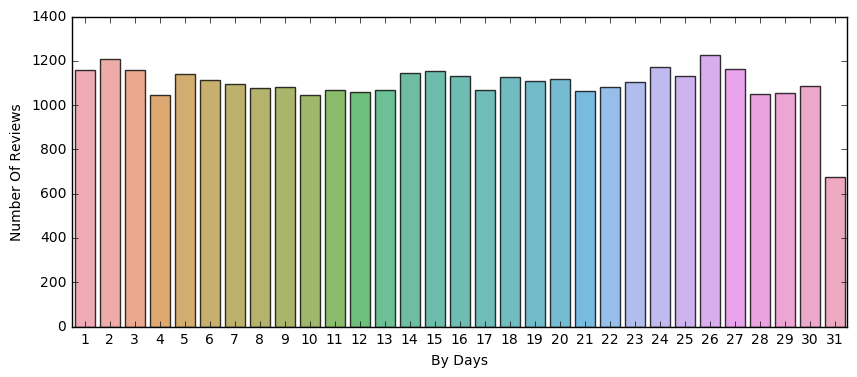

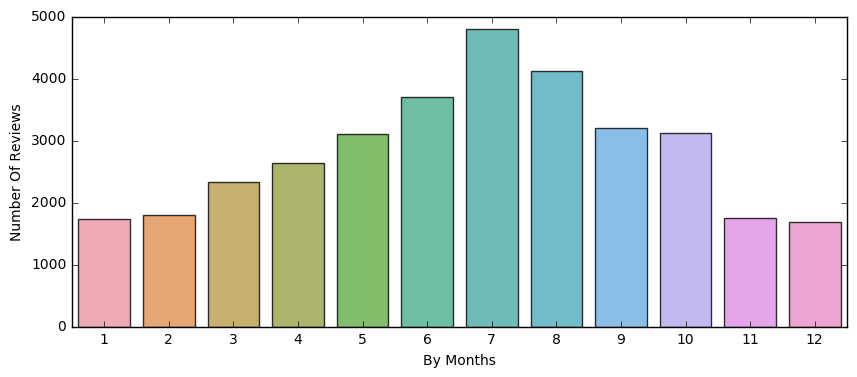

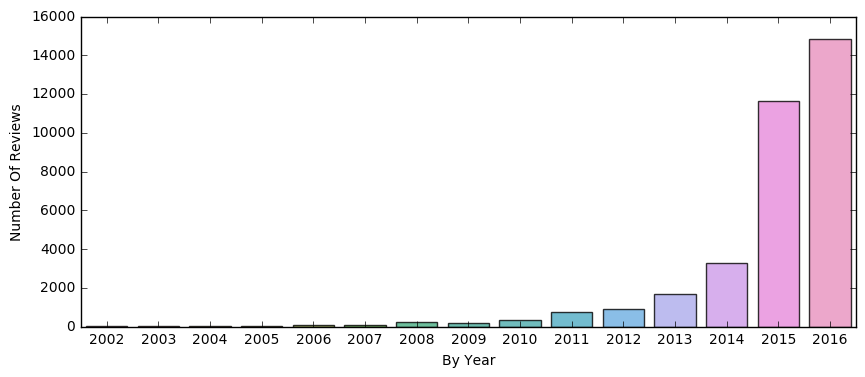

In [7]:
### 用户留言的时间段

Review_Day_Count = data['day'].value_counts()
plt.figure(figsize=(10,4))
sns.barplot(Review_Day_Count.index, Review_Day_Count.values, alpha=0.8)
plt.ylabel("Number Of Reviews")
plt.xlabel("By Days")
plt.show()

Reviews_Count_Month = data['month'].value_counts()
plt.figure(figsize=(10,4))
sns.barplot(Reviews_Count_Month.index, Reviews_Count_Month.values, alpha=0.8)
plt.ylabel("Number Of Reviews")
plt.xlabel("By Months")
plt.show()

Reviews_Year = data['year'].value_counts()
plt.figure(figsize=(10,4))
sns.barplot(Reviews_Year.index, Reviews_Year.values, alpha=0.8)
plt.ylabel("Number Of Reviews")
plt.xlabel("By Year")
plt.show()

In [19]:
data[data['name'] == 'The Alexandrian, Autograph Collection'].head()

,latitude,longitude,name,province,reviewsdate,reviewsrating,reviewstext,reviewsusername,new_date,new_time,day,month,year
4528,38.80474,-77.04455,"The Alexandrian, Autograph Collection",VA,2013-08-25T00:00:00Z,5,The hotel was great. Staff went above and beyo...,A verified traveler,2013-08-25,00:00:00,25,8,2013
4529,38.80474,-77.04455,"The Alexandrian, Autograph Collection",VA,2010-08-26T00:00:00Z,4,A wonderful hotel - would definitely stay ther...,A verified traveler,2010-08-26,00:00:00,26,8,2010
4530,38.80474,-77.04455,"The Alexandrian, Autograph Collection",VA,2014-10-17T00:00:00Z,5,"Tolles Zimmer, nettes Personal",Jennifer,2014-10-17,00:00:00,17,10,2014
4531,38.80474,-77.04455,"The Alexandrian, Autograph Collection",VA,2012-06-09T00:00:00Z,5,Outstanding. Will definitely return.,A verified traveler,2012-06-09,00:00:00,9,6,2012
4532,38.80474,-77.04455,"The Alexandrian, Autograph Collection",VA,2014-04-28T00:00:00Z,4,I needed a place to stay in VA that was close ...,David,2014-04-28,00:00:00,28,4,2014


In [115]:
#6-8月的评分有无变化
#datamonth = data[data['month'] == 6 | data['month'] == 7 | data['month'] == 8]
datamonth = data[(data['month']==6) | (data['month']==7)|(data['month']==8)]

In [118]:
hotel_name = data['name'].value_counts()
tophotel=hotel_name[:10].index
print(hotel_name[:10])


The Alexandrian, Autograph Collection       1122
Howard Johnson Inn - Newburgh                664
Americas Best Value Inn                      559
Fiesta Inn and Suites                        546
Ip Casino Resort Spa                         389
Comfort Suites                               326
Best Western of Long Beach                   317
Best Western Plus Waterville Grand Hotel     314
Plaza Hotel and Casino - Las Vegas           289
Anaheim Marriott Suites                      275
Name: name, dtype: int64


In [122]:
allmean=data['reviewsrating'].groupby(data['name']).mean()
topmean=allmean[tophotel]

topmean

The Alexandrian, Autograph Collection       4.498217
Howard Johnson Inn - Newburgh               2.745482
Americas Best Value Inn                     2.742397
Fiesta Inn and Suites                       1.454212
Ip Casino Resort Spa                        4.020566
Comfort Suites                              3.941718
Best Western of Long Beach                  3.662461
Best Western Plus Waterville Grand Hotel    3.665605
Plaza Hotel and Casino - Las Vegas          3.224913
Anaheim Marriott Suites                     4.327273
Name: reviewsrating, dtype: float64

In [121]:
allmean=datamonth['reviewsrating'].groupby(datamonth['name']).mean()
topmean=allmean[tophotel]

topmean

The Alexandrian, Autograph Collection       4.500000
Howard Johnson Inn - Newburgh               2.649746
Americas Best Value Inn                     2.612403
Fiesta Inn and Suites                       1.500000
Ip Casino Resort Spa                        4.049751
Comfort Suites                              3.881481
Best Western of Long Beach                  3.512195
Best Western Plus Waterville Grand Hotel    3.765217
Plaza Hotel and Casino - Las Vegas          3.186170
Anaheim Marriott Suites                     4.351955
Name: reviewsrating, dtype: float64

In [ ]:
plt.figure(figsize=(10,4))
sns.barplot(topmean.index, topmean.values)
#plt.ylabel("Number Of Review")
#plt.xlabel("Average Order By Days")
plt.xticks(rotation=90)
plt.show()


In [ ]:
#### 对评论内容进行文本分析

In [69]:
#词云图
from nltk.corpus import stopwords
from itertools import chain

stop_words=[['hotel','night','stay','one'],stopwords.words('english')]
stop_words_new = list(chain(*stop_words))

In [18]:
## 去停用词
## 所有评论的词云图
words = " ".join(str(s) for s in data['reviewstext'])



In [19]:
wordcloud = WordCloud(stopwords=stop_words_new,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(words)

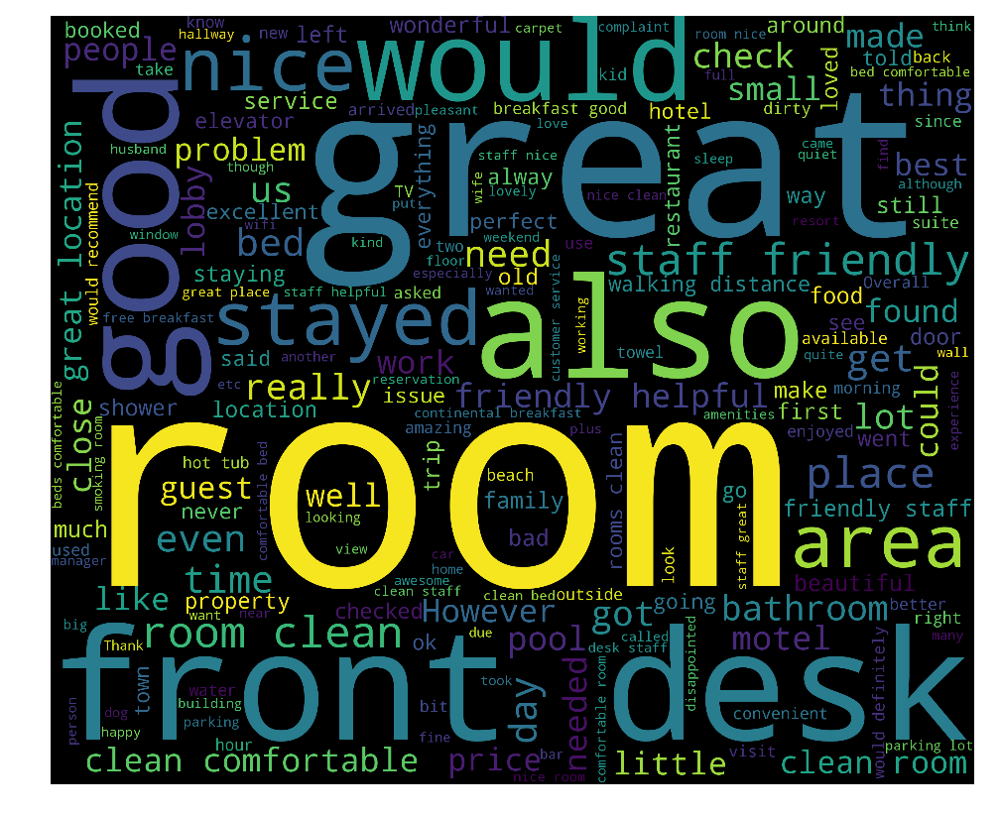

In [20]:
plt.figure(1,figsize=(12, 12)) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.show()

In [ ]:
# 用户关注room, staff
# 不是很有用

In [20]:
#data['sentiment']
data.loc[data['reviewsrating'] >=4,'sentiment'] = 'positive'
data.loc[data['reviewsrating'] <=2,'sentiment'] = 'negative'
data.loc[data['reviewsrating'] ==3,'sentiment'] = 'neutral'



In [15]:
#data.loc[data['reviewsrating'] >=4,'sentiment1'] = 1
#data.loc[data['reviewsrating'] <=2,'sentiment1'] = 0


In [21]:
data['sentiment'].value_counts()

positive    22229
negative     6118
neutral      5625
Name: sentiment, dtype: int64

In [22]:
data.head()

,latitude,longitude,name,province,reviewsdate,reviewsrating,reviewstext,reviewsusername,new_date,new_time,day,month,year,sentiment
0,45.421611,12.376187,Hotel Russo Palace,GA,2013-09-22T00:00:00Z,4,Pleasant 10 min walk along the sea front to th...,Russ (kent),2013-09-22,00:00:00,22,9,2013,positive
1,45.421611,12.376187,Hotel Russo Palace,GA,2015-04-03T00:00:00Z,5,Really lovely hotel. Stayed on the very top fl...,A Traveler,2015-04-03,00:00:00,3,4,2015,positive
2,45.421611,12.376187,Hotel Russo Palace,GA,2013-10-27T00:00:00Z,5,We stayed here for four nights in October. The...,Julie,2013-10-27,00:00:00,27,10,2013,positive
4,45.421611,12.376187,Hotel Russo Palace,GA,2015-04-05T00:00:00Z,5,We loved staying on the island of Lido! You ne...,A Traveler,2015-04-05,00:00:00,5,4,2015,positive
5,45.421611,12.376187,Hotel Russo Palace,GA,2014-06-10T00:00:00Z,4,Lovely view out onto the lagoon. Excellent vie...,A Traveler,2014-06-10,00:00:00,10,6,2014,positive


In [23]:
# 去停用词
# 所有negative评论的词云图
df=data[data['sentiment']=='negative']
word = ' '.join(str(s) for s in df['reviewstext'])


In [27]:
wordcloud = WordCloud(stopwords=stop_words_new,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

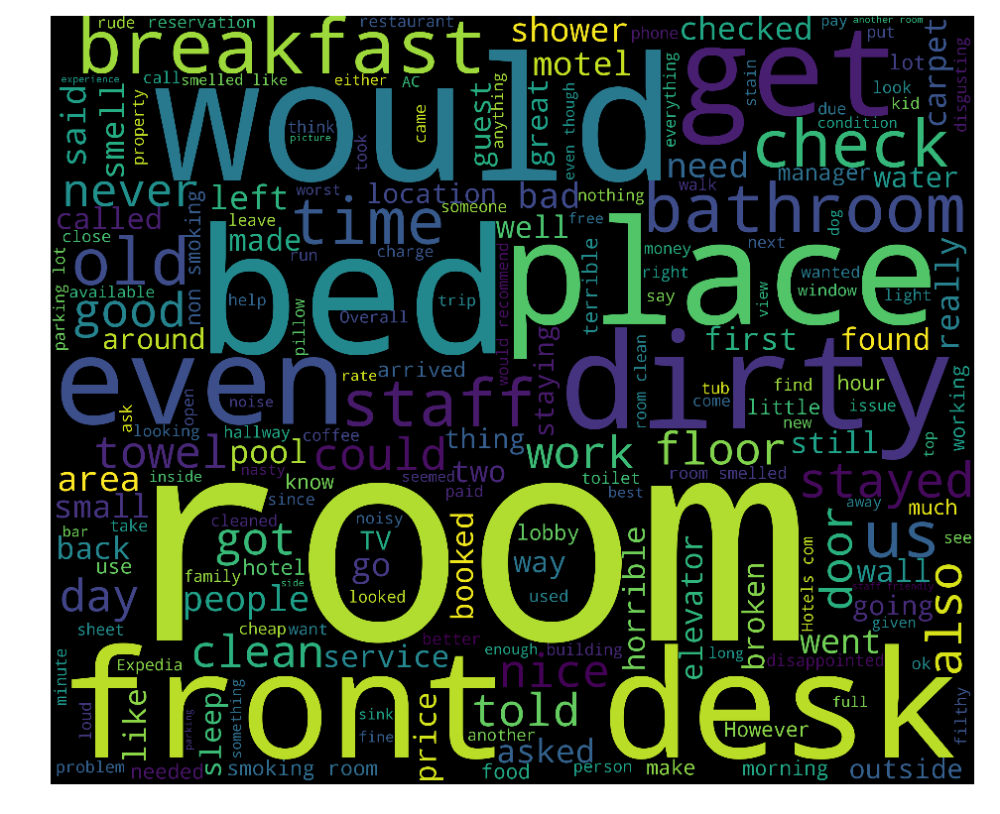

In [28]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
# negative :dirty, bathroom, front desk,elevator, smell,breakfast

In [29]:
# 去停用词
# 所有positive评论的词云图
df=data[data['sentiment']=='positive']
word = ' '.join(str(s) for s in df['reviewstext'])


In [30]:
wordcloud = WordCloud(stopwords=stop_words_new,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

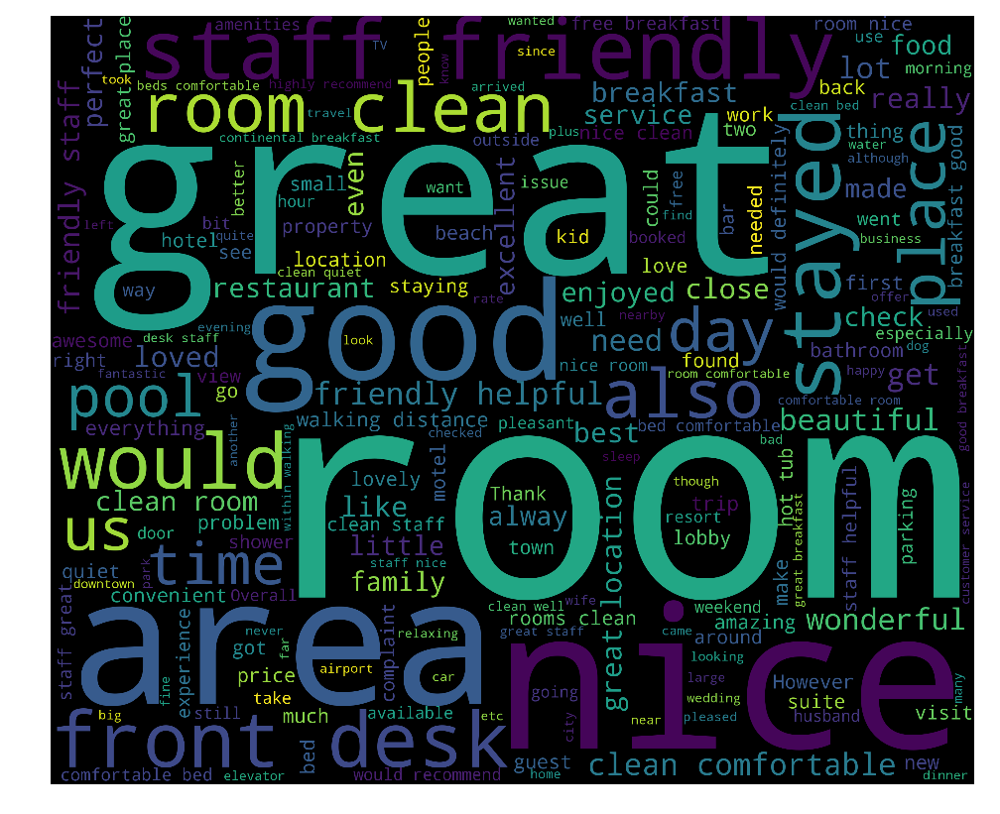

In [31]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
# positive 关注点：staff friendly, clean

In [27]:
from nltk.tokenize import word_tokenize, sent_tokenize 
from nltk import pos_tag
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pandas as pd
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
import itertools
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
%matplotlib inline
init_notebook_mode()

In [29]:
from itertools import chain
stop_words=[['hotel','night','stay'],stopwords.words('english')]
stop_words_new = list(chain(*stop_words))

In [30]:
#Creating a function that I will use to clean review strings
#Function makes the string 'txt' lowercase, removes stopwords, finds the length, and pulls out only adjectives
#Returns a list of the length, cleaned txt, and only adjective txt
from itertools import chain

def cleanme(txt):
    sent = txt.lower()
    wrds = word_tokenize(sent)
    stop_words=[['hotel','night','stay','one','stayed'],stopwords.words('english')]
    stop_words_new = list(chain(*stop_words))
    clwrds = [w for w in wrds if w not in stop_words_new]
    pos = pd.DataFrame(pos_tag(wrds))
    pos1 = " ".join(list(pos[pos[1].str.contains("NN")].iloc[:,0]))
    pos2 = " ".join(list(pos[pos[1].str.contains("JJ")].iloc[:,0]))
    rt = [" ".join(clwrds), pos1,pos2]
    return(rt)

In [94]:
#from itertools import chain
#stop_words=[['hotel','night','stay'],stopwords.words('english')]
#stop_words = list(chain(*stop_words))
#print (stop_words)

In [31]:
#Filter to only include datapoints within the US
data = data[((data['latitude']<=50.0) & (data['latitude']>=24.0)) & ((data['longitude']<=-65.0) & (data['longitude']>=-122.0))]

In [32]:
tmp = list()
for i in range(len(data)):
    tmp.append(cleanme(data.iloc[i,:]['reviewstext']))
tmp = pd.DataFrame(tmp)
tmp.columns = ['cleanrev', 'nounreview',"adjreview"]

In [33]:
tmp.head()

,cleanrev,nounreview,adjreview
0,"wonderful , relaxing time . staff completely a...",time staff corner king room kitchen patios bat...,wonderful relaxing attentive deluxe available ...
1,palm springs day temperature 123 degrees ! des...,springs day temperature degrees stay hotel sta...,palm wonderful little paradise friendly little...
2,arrived palm springs sure expect ... .it 's qu...,palm springs .it kinda place season street gat...,sure quiet residential wooden sure spacious we...
3,place really little paradise ! ! beautiful bou...,place paradise boutique style hotel everything...,little beautiful fresh best comfortable wonder...
4,spent 3 nights little paradise boutique mother...,spent nights boutique hotel trip experience re...,little paradise mother-daughter wonderful rela...


In [34]:
#Add calculated columns back to the dataset
data = data.reset_index()
#data = pd.concat([data,tmp], axis=1)
data.head()

,index,latitude,longitude,name,province,reviewsdate,reviewsrating,reviewstext,reviewsusername,new_date,new_time,day,month,year,sentiment
0,36,33.802822,-116.54269,Little Paradise Hotel,CA,2016-02-19T00:00:00Z,5,"We had a wonderful, relaxing time. The staff w...",Flo H,2016-02-19,00:00:00,19,2,2016,positive
1,37,33.802822,-116.54269,Little Paradise Hotel,CA,2016-06-25T00:00:00Z,5,We were in Palm Springs on the day the tempera...,Julie R,2016-06-25,00:00:00,25,6,2016,positive
2,38,33.802822,-116.54269,Little Paradise Hotel,CA,2016-08-01T00:00:00Z,5,We arrived in Palm Springs not sure what to ex...,martin n,2016-08-01,00:00:00,1,8,2016,positive
3,39,33.802822,-116.54269,Little Paradise Hotel,CA,2016-06-08T00:00:00Z,5,This place really is a little paradise!! A bea...,shetravels66,2016-06-08,00:00:00,8,6,2016,positive
4,40,33.802822,-116.54269,Little Paradise Hotel,CA,2016-03-17T00:00:00Z,5,Spent 3 nights at Little Paradise boutique hot...,Mary Ellen R,2016-03-17,00:00:00,17,3,2016,positive


In [507]:
noun_text = ' '.join(str(s) for s in dfneg['nounreview'])
tokens = [word for word in word_tokenize(noun_text) if word.isalnum() and word not in stopwords.words("english")]

In [508]:
FreqDist(tokens).most_common(50)

[('room', 267),
 ('hotel', 125),
 ('night', 65),
 ('desk', 55),
 ('rooms', 43),
 ('time', 42),
 ('place', 42),
 ('bed', 41),
 ('front', 39),
 ('door', 39),
 ('bathroom', 37),
 ('towels', 36),
 ('staff', 34),
 ('breakfast', 34),
 ('smell', 31),
 ('people', 29),
 ('stay', 28),
 ('motel', 27),
 ('lot', 26),
 ('morning', 25),
 ('price', 25),
 ('shower', 23),
 ('way', 23),
 ('tv', 22),
 ('manager', 21),
 ('tub', 21),
 ('location', 19),
 ('smoking', 19),
 ('parking', 19),
 ('service', 19),
 ('money', 18),
 ('toilet', 18),
 ('sink', 17),
 ('smoke', 17),
 ('clerk', 16),
 ('day', 16),
 ('floor', 16),
 ('hair', 15),
 ('phone', 15),
 ('sheets', 15),
 ('reservation', 13),
 ('area', 13),
 ('beds', 13),
 ('dirty', 13),
 ('carpet', 13),
 ('someone', 12),
 ('lobby', 12),
 ('street', 12),
 ('ice', 11),
 ('stains', 11)]

In [ ]:
#Americas Best Value Inn

In [39]:
subdata = data[data['name'] == "Americas Best Value Inn"]

dfpos=subdata[subdata['sentiment']=='positive']

dfneg = subdata[subdata['sentiment']=='negative']

In [40]:

word = ' '.join(str(s) for s in dfpos['nounreview'])
wordcloud = WordCloud(stopwords=stop_words_new,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

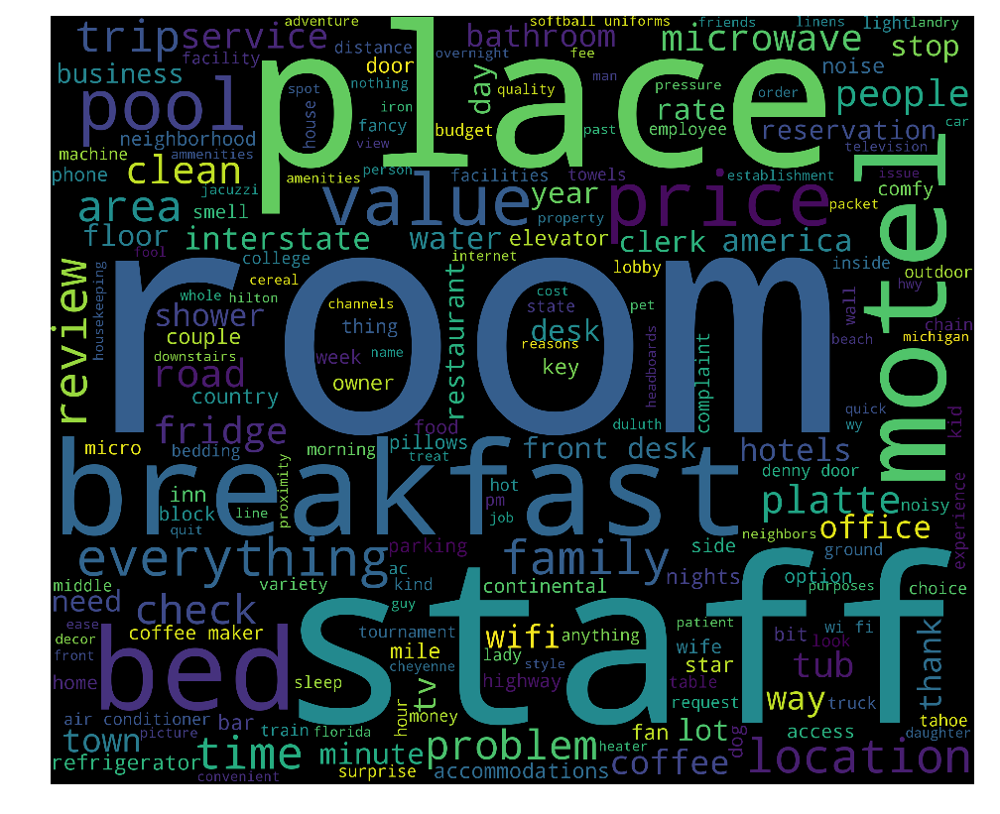

In [41]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [42]:

word = ' '.join(str(s) for s in dfpos['adjreview'])
wordcloud = WordCloud(stopwords=stop_words_new,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

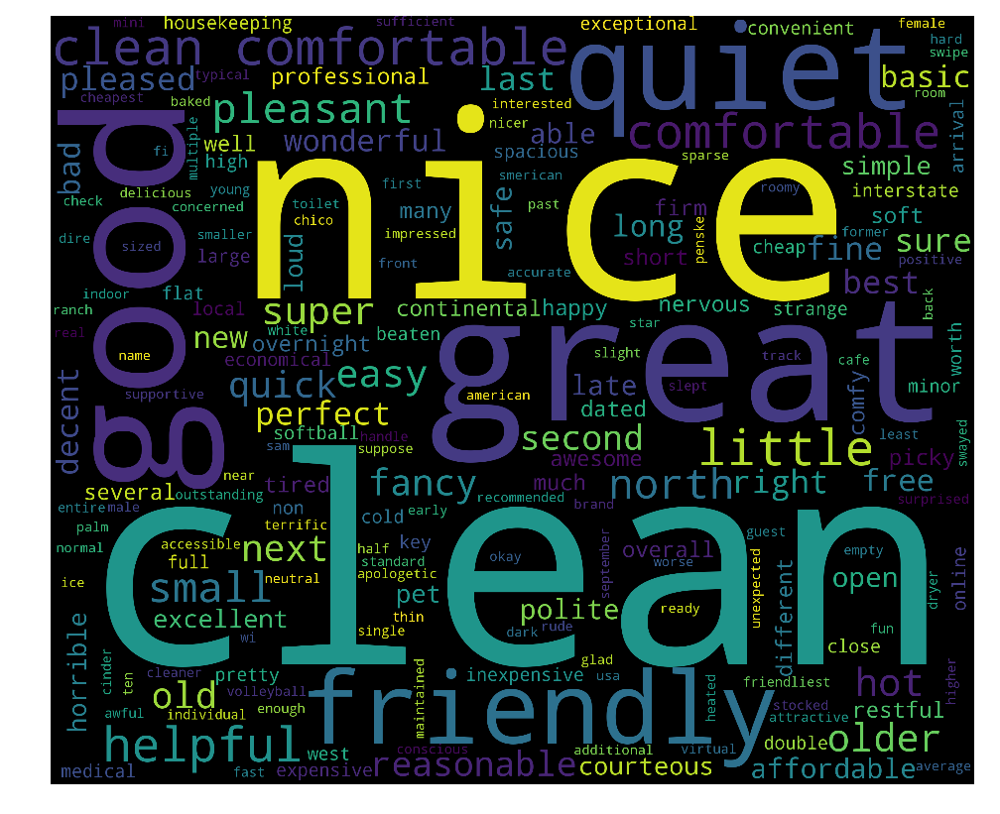

In [43]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [45]:

word = ' '.join(str(s) for s in dfneg['nounreview'])
wordcloud = WordCloud(stopwords=stop_words_new,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

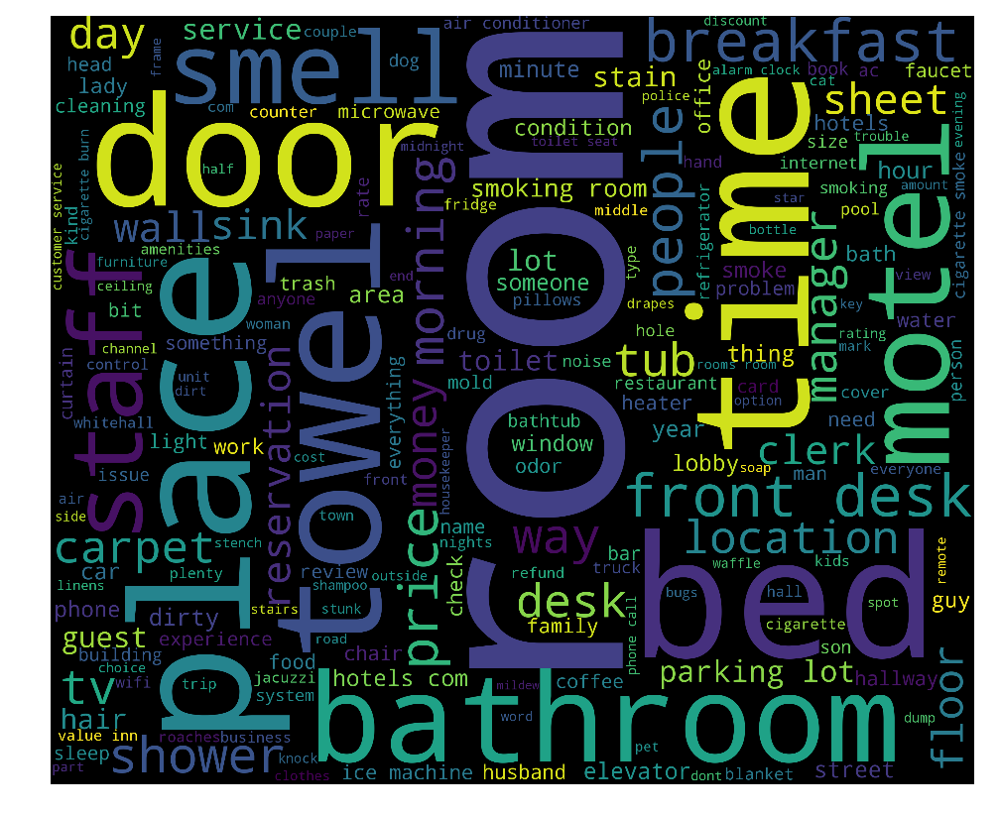

In [46]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [48]:

word = ' '.join(str(s) for s in dfneg['adjreview'])
wordcloud = WordCloud(stopwords=stop_words_new,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

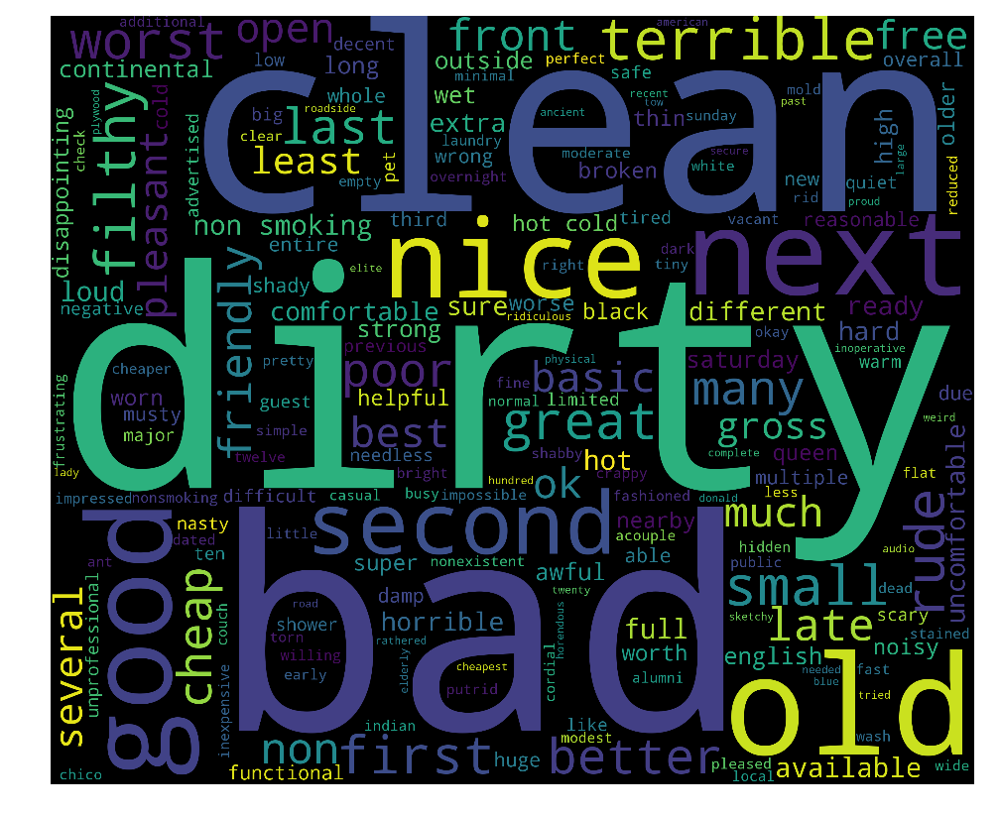

In [49]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [53]:

from nltk import word_tokenize, FreqDist, bigrams, trigrams
from nltk.corpus import stopwords

neg_text = ' '.join(str(s) for s in dfneg['cleanrev'])
tokens = [word for word in word_tokenize(neg_text) if word.isalnum() and word not in stopwords.words("english")]

In [54]:
FreqDist(bigrams(tokens)).most_common(50)


[(('front', 'desk'), 39),
 (('parking', 'lot'), 19),
 (('smoking', 'room'), 13),
 (('would', 'recommend'), 10),
 (('room', 'smelled'), 10),
 (('smelled', 'like'), 9),
 (('non', 'smoking'), 9),
 (('looked', 'like'), 8),
 (('ice', 'machine'), 8),
 (('next', 'morning'), 7),
 (('desk', 'clerk'), 7),
 (('room', 'clean'), 6),
 (('cigarette', 'smoke'), 6),
 (('get', 'pay'), 6),
 (('would', 'never'), 6),
 (('continental', 'breakfast'), 6),
 (('value', 'inn'), 6),
 (('best', 'value'), 6),
 (('even', 'though'), 5),
 (('first', 'room'), 5),
 (('first', 'time'), 5),
 (('america', 'best'), 5),
 (('get', 'room'), 5),
 (('give', 'us'), 5),
 (('air', 'conditioner'), 5),
 (('staff', 'nice'), 5),
 (('got', 'room'), 5),
 (('next', 'door'), 5),
 (('motel', '6'), 5),
 (('bathroom', 'door'), 5),
 (('room', 'could'), 5),
 (('worst', 'ever'), 5),
 (('smell', 'room'), 5),
 (('could', 'sleep'), 5),
 (('across', 'street'), 5),
 (('room', 'room'), 5),
 (('6', 'next'), 4),
 (('time', 'got'), 4),
 (('room', 'dirty'

In [57]:

pos_text = ' '.join(str(s) for s in dfpos['cleanrev'])
tokens = [word for word in word_tokenize(pos_text) if word.isalnum() and word not in stopwords.words("english")]

In [58]:
FreqDist(bigrams(tokens)).most_common(50)

[(('room', 'clean'), 13),
 (('clean', 'comfortable'), 12),
 (('north', 'platte'), 10),
 (('staff', 'friendly'), 9),
 (('great', 'value'), 8),
 (('clean', 'quiet'), 7),
 (('friendly', 'helpful'), 7),
 (('front', 'desk'), 7),
 (('room', 'nice'), 7),
 (('nice', 'clean'), 7),
 (('well', 'maintained'), 6),
 (('continental', 'breakfast'), 6),
 (('friendly', 'room'), 6),
 (('staff', 'nice'), 6),
 (('friendly', 'staff'), 6),
 (('clean', 'room'), 6),
 (('next', 'door'), 6),
 (('nice', 'staff'), 5),
 (('breakfast', 'good'), 5),
 (('make', 'sure'), 5),
 (('good', 'value'), 5),
 (('hot', 'tub'), 4),
 (('clean', 'beds'), 4),
 (('would', 'recommend'), 4),
 (('beds', 'comfortable'), 4),
 (('coffee', 'maker'), 4),
 (('best', 'value'), 4),
 (('fridge', 'microwave'), 4),
 (('great', 'place'), 4),
 (('location', 'great'), 4),
 (('would', 'definitely'), 4),
 (('got', 'room'), 4),
 (('denny', 'next'), 3),
 (('comfortable', 'great'), 3),
 (('super', 'clean'), 3),
 (('reserved', 'room'), 3),
 (('wanted', 'cl

In [31]:
#word = ' '.join(str(s) for s in tmp['nounreview'])
#word = word.split(" ")
#print(word)

In [39]:
from nltk import word_tokenize, FreqDist,  bigrams, trigrams
from nltk.corpus import stopwords

In [15]:
all_noun_text = " ".join(data['nounreview'].apply(str).values)

tokens = [word for word in word_tokenize(all_noun_text) if word.isalnum() and word not in stopwords.words("english")]

In [16]:
freqword = FreqDist(tokens).most_common(50)

In [51]:
#####实验
from sklearn.cluster import KMeans
kk = np.random.rand(100, 3) #生成一个随机数据，样本大小为100, 特征数为3

#假如我要构造一个聚类数为3的聚类器
estimator = KMeans(n_clusters=3)#构造聚类器
estimator.fit(kk)#聚类
label_pred = estimator.labels_ #获取聚类标签   等价于estimator.predict(kk)
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和

kk.shape

(100, 3)

In [55]:
# word2vec模型
from gensim.models.word2vec import Word2Vec
sentences = tokenize(data['nounreview']) #切分函数产生句子

#构建并规范word2vec模型
model = Word2Vec(sentences, size = 100, window = 10, min_count = 1, sample = 1e-3, workers = 2)
model.init_sims(replace = True)
# size为向量长度




In [128]:
#打印word2vec产生的单词room的向量
#print(model['room'])
#points = np.array([model['room'],model['staff']])
#points = np.array([model[freqword['word'][1]]])
#np.array([model])
tt = np.array([model['room'],model['staff'],model['service'],model['breakfast'],model['restaurant'],model['wifi'],\
         model['location'],model['place'],model['price'],model['pool'],model['bed'],model['bathroom'],model['clean'],\
               model['smell'],model['food'],model['parking'],model['floor'],model['towels'],model['coffee'],model['shower'],\
               model['tv'],model['tub']])

D:\Anaconda\Anaconda\lib\site-packages\ipykernel\__main__.py:6: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



In [129]:
from sklearn.cluster import KMeans

#假如我要构造一个聚类数为3的聚类器
estimator = KMeans(n_clusters=3)#构造聚类器
estimator.fit(tt)#聚类
label_pred = estimator.labels_ #获取聚类标签   等价于estimator.predict(kk)
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和
print(label_pred)

[1 0 2 2 2 1 0 0 0 0 1 1 0 1 2 0 1 1 2 1 1 1]


In [48]:
#from sklearn.cluster import KMeans

#num_clusters = 5
#km_cluster = KMeans(n_clusters=num_clusters, max_iter=300, n_init=40, \
#                    init='k-means++',n_jobs=-1)

#返回各自文本的所被分配到的类索引
#result = km_cluster.fit_predict(tfidf_matrix)

#print ("Predicting result: ", result)
#len(result)

Predicting result:  [4 4 3 ..., 0 1 1]


33972

Original cluster by hierarchy clustering:
 [3 6 7 5 7 9 6 6 6 4 2 1 6 3 7 8 3 1 5 1 2 1]


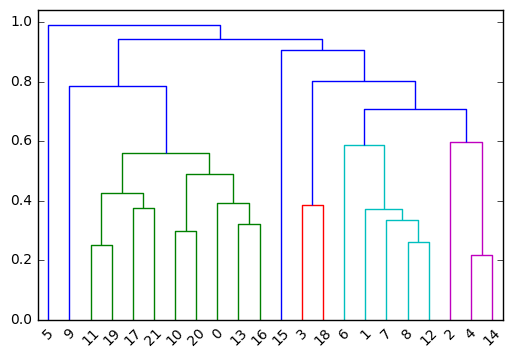

In [93]:
# 导入相应的包
import scipy
import scipy.cluster.hierarchy as sch
from scipy.cluster.vq import vq,kmeans,whiten


#1. 层次聚类
#生成点与点之间的距离矩阵,这里用的欧氏距离:
disMat = sch.distance.pdist(tt,'euclidean') 
#进行层次聚类:
Z=sch.linkage(disMat,method='average') 
#将层级聚类结果以树状图表示出来并保存为plot_dendrogram.png
P=sch.dendrogram(Z)
#plt.savefig('plot_dendrogram.png')
#根据linkage matrix Z得到聚类结果:
cluster= sch.fcluster(Z,t=1) 

print ("Original cluster by hierarchy clustering:\n",cluster)



In [17]:
freqword = pd.DataFrame(freqword)
freqword.columns = ["word","freq"]
freqword

,word,freq
0,room,19740
1,hotel,17551
2,staff,9806
3,breakfast,7956
4,rooms,5616
5,stay,4910
6,night,4597
7,place,4350
8,location,4048
9,area,3633


In [49]:
# 去停用词，变小写
# 所有评论，加上自己添加的停用词
word = ' '.join(str(s) for s in data['cleanrev'])


In [50]:
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

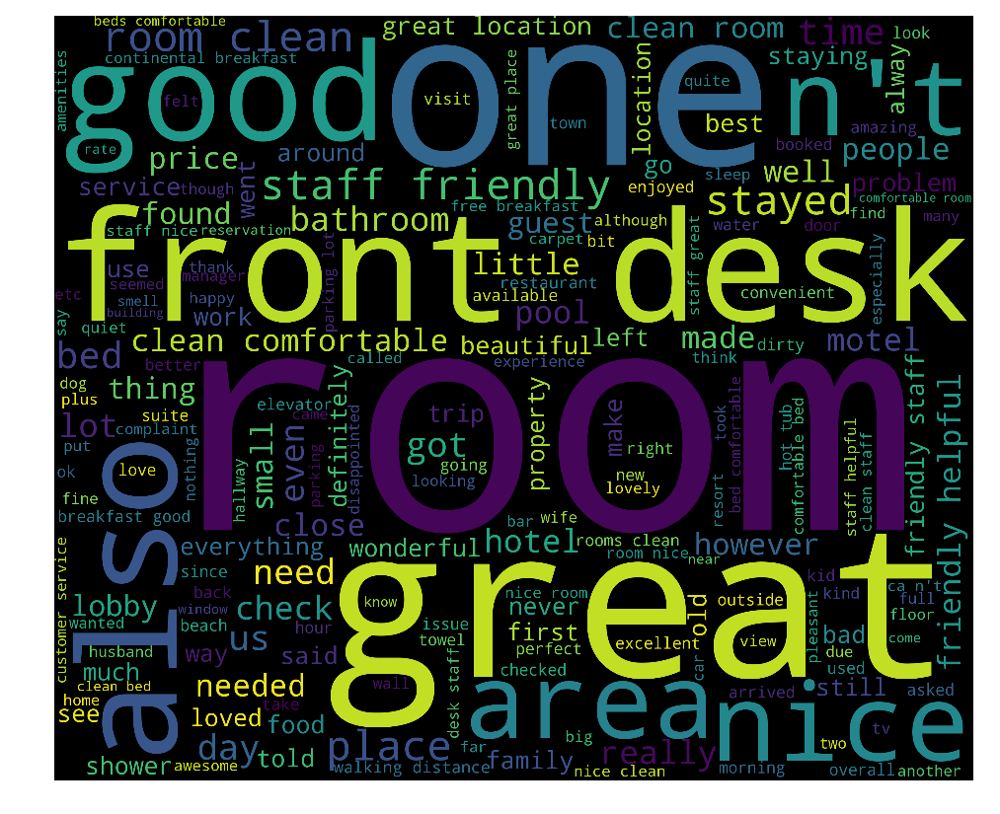

In [51]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [97]:
# 去停用词
# 形容词，negative
df=data[data['sentiment']=='negative']
word = ' '.join(str(s) for s in df['nounreview'])


In [98]:
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

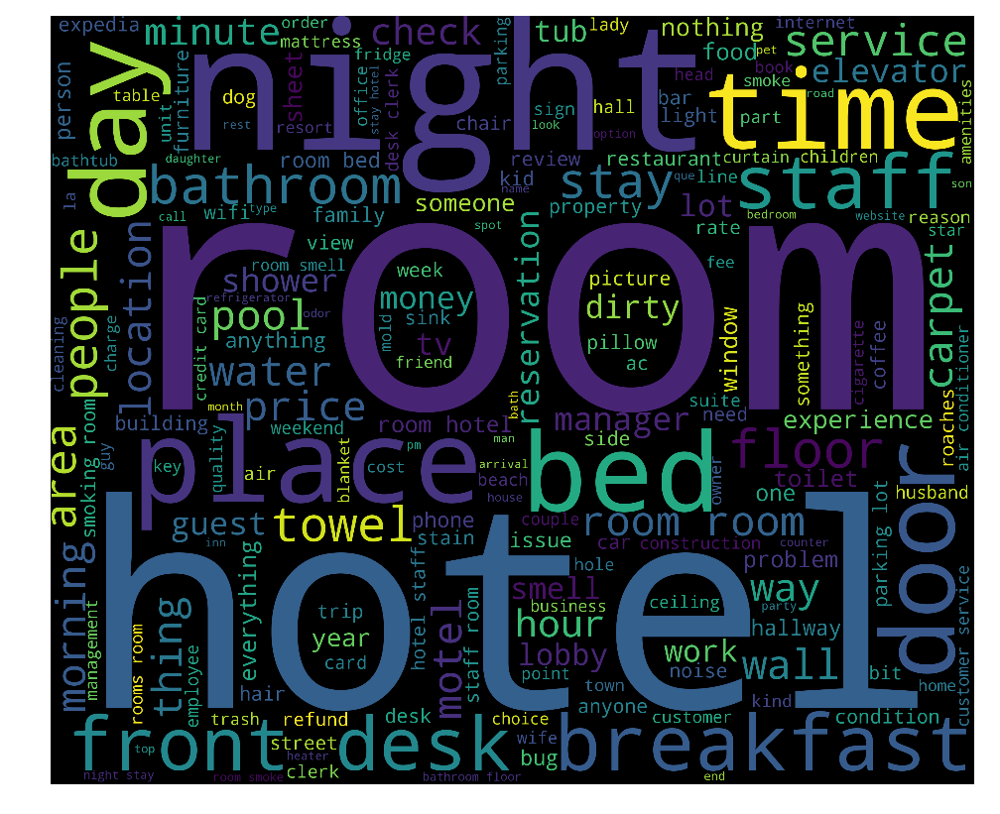

In [99]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
# negative 用户不满意的地方：old, dirty，shower,small,broken


In [61]:
#去停用词
# 形容词，positive
df=data[data['sentiment']=='positive']
word = ' '.join(str(s) for s in df['adjreview'])


In [62]:
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

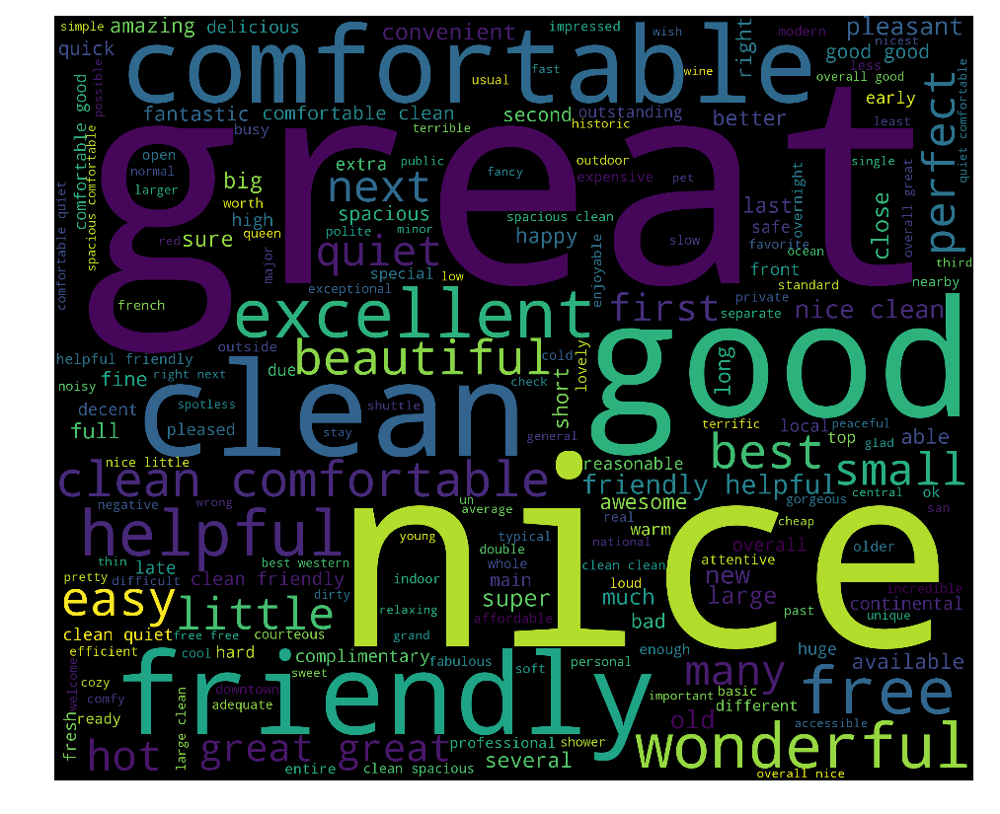

In [63]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
# 用户满意的地方： friendly, clean,helpful, comfortable,quiet

In [135]:
# 去停用词
# 根据名词画词云图
word = ' '.join(str(s) for s in data['nounreview'])


In [136]:
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(word)

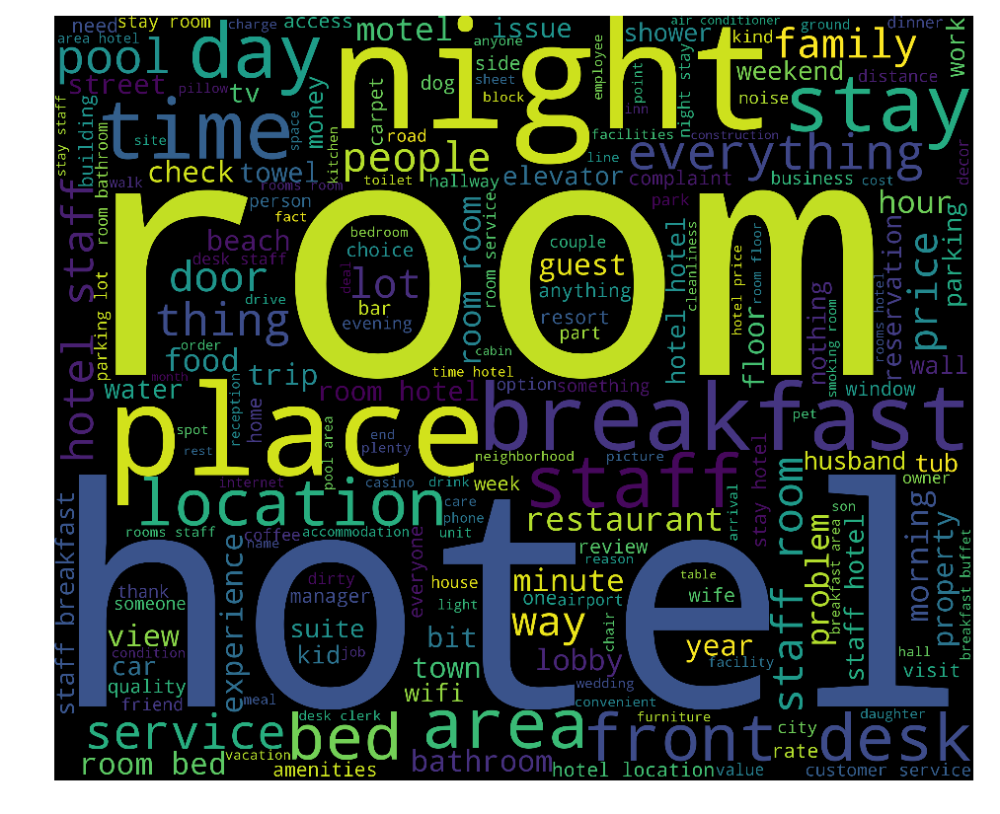

In [137]:
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
#用户关注的地方：locatoin, staff, breakfast, room

In [100]:
df=data[data['sentiment']=='positive']
pos_noun_text = " ".join(df['nounreview'].apply(str).values)

tokens = [word for word in word_tokenize(pos_noun_text) if word.isalnum() and word not in stopwords.words("english")]

In [102]:
freqword = FreqDist(tokens).most_common(50)
freqword

[('hotel', 11229),
 ('room', 10102),
 ('staff', 7418),
 ('breakfast', 5613),
 ('stay', 3619),
 ('rooms', 3531),
 ('location', 3006),
 ('place', 2761),
 ('area', 2551),
 ('night', 2350),
 ('pool', 2232),
 ('service', 2143),
 ('time', 2120),
 ('bed', 1725),
 ('desk', 1675),
 ('everything', 1612),
 ('food', 1419),
 ('day', 1371),
 ('price', 1324),
 ('restaurants', 1278),
 ('family', 1237),
 ('beds', 1217),
 ('front', 1196),
 ('view', 966),
 ('inn', 959),
 ('town', 953),
 ('restaurant', 947),
 ('way', 912),
 ('trip', 873),
 ('parking', 871),
 ('bathroom', 870),
 ('experience', 870),
 ('people', 805),
 ('morning', 784),
 ('beach', 783),
 ('coffee', 757),
 ('nights', 739),
 ('hotels', 711),
 ('street', 689),
 ('floor', 673),
 ('distance', 666),
 ('lot', 664),
 ('bit', 630),
 ('lobby', 623),
 ('check', 622),
 ('business', 616),
 ('home', 613),
 ('door', 612),
 ('bar', 602),
 ('weekend', 580)]

In [103]:
df=data[data['sentiment']=='negative']
neg_noun_text = " ".join(df['nounreview'].apply(str).values)

tokens = [word for word in word_tokenize(neg_noun_text) if word.isalnum() and word not in stopwords.words("english")]

In [104]:
freqword = FreqDist(tokens).most_common(50)
freqword

[('room', 5652),
 ('hotel', 3408),
 ('night', 1271),
 ('rooms', 1163),
 ('desk', 1095),
 ('staff', 1031),
 ('bed', 1017),
 ('breakfast', 946),
 ('place', 933),
 ('front', 771),
 ('door', 759),
 ('bathroom', 756),
 ('time', 680),
 ('stay', 621),
 ('floor', 592),
 ('day', 526),
 ('towels', 503),
 ('service', 497),
 ('people', 493),
 ('water', 466),
 ('area', 459),
 ('pool', 446),
 ('beds', 427),
 ('shower', 418),
 ('morning', 378),
 ('price', 375),
 ('location', 371),
 ('smell', 354),
 ('tv', 353),
 ('sheets', 336),
 ('lot', 331),
 ('motel', 330),
 ('carpet', 320),
 ('way', 314),
 ('dirty', 304),
 ('tub', 301),
 ('manager', 296),
 ('work', 291),
 ('money', 289),
 ('air', 286),
 ('experience', 286),
 ('toilet', 286),
 ('nothing', 271),
 ('coffee', 262),
 ('check', 258),
 ('lobby', 253),
 ('smoke', 253),
 ('days', 253),
 ('walls', 252),
 ('inn', 251)]

In [41]:
#ls = [1,2,3,"ll"]
#" ".join(str(s) for s in ls)

'1 2 3 ll'

In [13]:
import nltk
import re
import os
import codecs
from sklearn import feature_extraction
import mpld3

In [24]:
# 载入 nltk 的 SnowballStemmer 作为“stemmer”变量
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")

In [20]:
# 这里我定义了一个分词器（tokenizer）和词干分析器（stemmer），它们会输出给定文本词干化后的词集合
def tokenize_and_stem(text):
    # 首先分句，接着分词，而标点也会作为词例存在
    tokens = [word.lower() for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    # 过滤所有不含字母的词例（例如：数字、纯标点）
    for token in tokens:
        if re.search('[a-zA-Z]',token):
            filtered_tokens.append(token)
    stems = [stemmer.stem(t) for t in filtered_tokens]
    return stems
    

In [35]:
def tokenize_only(text):
    # 首先分句，接着分词，而标点也会作为词例存在
    tokens = [word.lower() for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    # 过滤所有不含字母的词例（例如：数字、纯标点）
    for token in tokens:
        if re.search('[a-zA-Z]',token):
            filtered_tokens.append(token)
    return filtered_tokens

In [36]:
# 扩充列表后变成了非常庞大的二维（flat）词汇表
totalvocab_stemmed = []
totalvocab_tokenized = []
for i in data['reviewstext']:
    allwords_stemmed = tokenize_and_stem(i) # 进行分词和词干化
    totalvocab_stemmed.extend(allwords_stemmed)  # 扩充“totalvocab_stemmed”列表
    
    allwords_tokenized = tokenize_only(i)
    totalvocab_tokenized.extend(allwords_tokenized)
    


In [18]:
vocab_frame = pd.DataFrame({'words': totalvocab_tokenized}, index = totalvocab_stemmed)
print ('there are ' + str(vocab_frame.shape[0]) + ' item in vocab_frame')

there are 1588460 itme in vocab_frame


In [19]:
print (vocab_frame.head()) #观察词干化后的词

             words
pleasant  pleasant
min            min
walk          walk
along        along
the            the


In [ ]:
#Tf-idf 与文本相似度

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer

# 定义向量化参数
tfidf_vectorizer = TfidfVectorizer(max_df = 0.8, max_features = 200000,
                                  min_df = 0.2, stop_words = 'english',
                                  use_idf = True, tokenizer = tokenize_and_stem, ngram_range = (1,3))

%time tfidf_matrix = tfidf_vectorizer.fit_transform(data['cleanrev']) # 向量化文本

print(tfidf_matrix.shape)


Wall time: 1min 12s
(33972, 5)


In [50]:
tfidf_vectorizer = TfidfVectorizer(min_df = 0.1, max_features = 200000,
                                   stop_words = 'english',
                                  use_idf = True)
tfidf_matrix = tfidf_vectorizer.fit_transform(data["cleanrev"])
tfidf_matrix.shape

(33972, 12)

In [51]:
terms = tfidf_vectorizer.get_feature_names() # “terms” 这个变量只是 tf-idf 矩阵中的特征（features）表，也是一个词汇表。
terms

['breakfast',
 'clean',
 'comfortable',
 'friendly',
 'good',
 'great',
 'location',
 'nice',
 'place',
 'room',
 'rooms',
 'staff']

In [ ]:
dist 变量被定义为 1 – 每个文档的余弦相似度。余弦相似度用以和 tf-idf 相互参照评价。
可以评价全文（剧情简介）中文档与文档间的相似度。被 1 减去是为了确保我稍后能在欧氏（euclidean）平面（二维平面）中绘制余弦距离。
注意 dist 可以用以评估任意两个或多个剧情简介间的相似度。

In [ ]:
def cos(vector1,vector2):  
    dot_product = 0.0  
    normA = 0.0  
    normB = 0.0  
    for a,b in zip(vector1,vector2):  
        dot_product += a*b  
        normA += a**2  
        normB += b**2  
    if normA == 0.0 or normB==0.0:  
        return None  
    else:  
        return dot_product / ((normA*normB)**0.5) 

In [32]:
from sklearn.metrics.pairwise import cosine_similarity


In [33]:
#dist = 1 - cosine_similarity(tfidf_matrix)
cosine_similarity(tfidf_matrix)

MemoryError: 

In [63]:
from sklearn.cluster import KMeans
num_clusters = 5
km = KMeans(n_clusters=num_clusters)
%time km.fit(tfidf_matrix)
clusters = km.labels_.tolist()

Wall time: 7.07 s


In [88]:
#sample = data[data["name"] == "The Alexandrian, Autograph Collection"]

In [89]:
#all_text = " ".join(sample["reviewstext"].apply(str).values)

In [64]:
#from nltk import word_tokenize, FreqDist, bigrams, trigrams
#from nltk.corpus import stopwords

#tokens = [word for word in word_tokenize(all_text.lower()) if word.isalnum() and word not in stopwords.words("english")]

In [18]:
posdata = data[data['sentiment'] == 'positive']
pos_text = " ".join(posdata['reviewstext'].apply(str).values)

from nltk import word_tokenize, FreqDist, bigrams, trigrams
from nltk.corpus import stopwords

tokens = [word for word in word_tokenize(pos_text) if word.isalnum() and word not in stopwords.words("english")]

In [19]:
tokens

['Pleasant',
 '10',
 'min',
 'walk',
 'along',
 'sea',
 'front',
 'Water',
 'Bus',
 'restaurants',
 'etc',
 'Hotel',
 'comfortable',
 'breakfast',
 'good',
 'quite',
 'variety',
 'Room',
 'aircon',
 'work',
 'well',
 'Take',
 'mosquito',
 'repelant',
 'Really',
 'lovely',
 'hotel',
 'Stayed',
 'top',
 'floor',
 'surprised',
 'Jacuzzi',
 'bath',
 'know',
 'getting',
 'Staff',
 'friendly',
 'helpful',
 'included',
 'breakfast',
 'great',
 'Great',
 'location',
 'great',
 'value',
 'money',
 'Did',
 'want',
 'leave',
 'We',
 'stayed',
 'four',
 'nights',
 'October',
 'The',
 'hotel',
 'staff',
 'welcoming',
 'friendly',
 'helpful',
 'Assisted',
 'booking',
 'tickets',
 'opera',
 'The',
 'rooms',
 'clean',
 'good',
 'shower',
 'light',
 'airy',
 'rooms',
 'windows',
 'could',
 'open',
 'wide',
 'Beds',
 'comfortable',
 'Plenty',
 'choice',
 'hotel',
 'nearby',
 'used',
 'We',
 'loved',
 'staying',
 'island',
 'Lido',
 'You',
 'need',
 'take',
 'water',
 'Venice',
 'get',
 'From',
 'train',

In [20]:
FreqDist(bigrams(tokens)).most_common(50)

[(('The', 'staff'), 1602),
 (('The', 'room'), 1598),
 (('The', 'hotel'), 1591),
 (('I', 'would'), 1249),
 (('front', 'desk'), 1113),
 (('staff', 'friendly'), 1045),
 (('We', 'stayed'), 954),
 (('room', 'clean'), 945),
 (('I', 'stayed'), 828),
 (('friendly', 'helpful'), 812),
 (('clean', 'comfortable'), 730),
 (('place', 'stay'), 724),
 (('The', 'rooms'), 694),
 (('The', 'breakfast'), 596),
 (('More', 'We'), 579),
 (('one', 'night'), 570),
 (('This', 'hotel'), 555),
 (('walking', 'distance'), 534),
 (('definitely', 'stay'), 527),
 (('would', 'stay'), 514),
 (('friendly', 'staff'), 503),
 (('stay', 'The'), 496),
 (('The', 'location'), 382),
 (('More', 'I'), 376),
 (('hot', 'tub'), 376),
 (('Our', 'room'), 375),
 (('hotel', 'clean'), 367),
 (('rooms', 'clean'), 366),
 (('stay', 'I'), 365),
 (('Very', 'nice'), 363),
 (('great', 'location'), 354),
 (('hotel', 'staff'), 350),
 (('More', 'The'), 349),
 (('would', 'definitely'), 347),
 (('Staff', 'friendly'), 346),
 (('More', 'This'), 343),
 (

In [138]:
negdata = data[data['sentiment'] == 'negative']
neg_text = " ".join(negdata['reviewstext'].apply(str).values)

tokens = [word for word in word_tokenize(neg_text) if word.isalnum() and word not in stopwords.words("english")]

In [29]:
FreqDist(bigrams(tokens)).most_common(50)

[(('front', 'desk'), 736),
 (('The', 'room'), 551),
 (('I', 'would'), 505),
 (('The', 'hotel'), 340),
 (('room', 'I'), 265),
 (('I', 'stayed'), 254),
 (('I', 'could'), 229),
 (('The', 'staff'), 184),
 (('When', 'I'), 180),
 (('I', 'never'), 179),
 (('I', 'booked'), 179),
 (('hotel', 'I'), 173),
 (('This', 'hotel'), 172),
 (('room', 'The'), 169),
 (('I', 'ever'), 155),
 (('one', 'night'), 151),
 (('parking', 'lot'), 151),
 (('room', 'smelled'), 151),
 (('I', 'got'), 148),
 (('never', 'stay'), 143),
 (('I', 'called'), 141),
 (('I', 'told'), 139),
 (('room', 'clean'), 134),
 (('More', 'I'), 132),
 (('smoking', 'room'), 129),
 (('I', 'went'), 126),
 (('smelled', 'like'), 125),
 (('stay', 'I'), 123),
 (('We', 'stayed'), 122),
 (('I', 'asked'), 117),
 (('would', 'recommend'), 114),
 (('another', 'room'), 114),
 (('The', 'breakfast'), 113),
 (('even', 'though'), 112),
 (('The', 'bed'), 111),
 (('The', 'bathroom'), 109),
 (('The', 'rooms'), 107),
 (('would', 'stay'), 106),
 (('The', 'front'), 

In [61]:
ndarhotel = (np.unique(data['name']))

hotels_list = pd.DataFrame(columns=['Hotel_Name','Avg_Review','Percentage'])

for i in range(50):
    hotels_list.loc[i] = (ndarhotel[i],(np.mean(data['reviews.rating'][data['name'] == ndarhotel[i]])),((np.mean(data['reviews.rating'][data['name'] == ndarhotel[i]]))/5))


In [65]:
hotels_list.head()

,Hotel_Name,Avg_Review,Percentage
0,1785 Inn,2.625000,0.525000
1,1900 House,4.571429,0.914286
2,40 Berkeley Hostel,3.329193,0.665839
3,A Bed & Breakfast In Cambridge,3.574074,0.714815
4,A Swallow's Nest Motel,0.000000,0.000000


 FreqDist(bigrams(tokens)).most_common(50)

In [110]:
sample_neg = data1[data1["reviews.rating"] <= 2.0]
neg_text = " ".join(sample_neg["reviews.text"].apply(str).values)
from nltk import word_tokenize, FreqDist, bigrams, trigrams
from nltk.corpus import stopwords

tokens = [word for word in word_tokenize(neg_text) if word.isalnum() and word not in stopwords.words("english")]

In [90]:
FreqDist(bigrams(tokens)).most_common(50)

[(('front', 'desk'), 1167),
 (('The', 'room'), 1094),
 (('I', 'would'), 820),
 (('The', 'hotel'), 776),
 (('I', 'stayed'), 449),
 (('The', 'staff'), 429),
 (('room', 'I'), 396),
 (('room', 'clean'), 380),
 (('one', 'night'), 346),
 (('I', 'could'), 333),
 (('We', 'stayed'), 321),
 (('This', 'hotel'), 304),
 (('staff', 'friendly'), 286),
 (('room', 'The'), 284),
 (('The', 'breakfast'), 279),
 (('I', 'booked'), 279),
 (('When', 'I'), 249),
 (('parking', 'lot'), 243),
 (('hotel', 'I'), 242),
 (('The', 'rooms'), 238),
 (('I', 'got'), 222),
 (('would', 'stay'), 221),
 (('More', 'The'), 221),
 (('I', 'never'), 215),
 (('The', 'bed'), 212),
 (('room', 'smelled'), 210),
 (('I', 'called'), 202),
 (('Our', 'room'), 200),
 (('YP', 'visitors'), 199),
 (('businesswith', 'YP'), 199),
 (('visitors', 'across'), 199),
 (('United', 'Statesand'), 199),
 (('Statesand', 'neighborhood'), 199),
 (('opinion', 'businesswith'), 199),
 (('across', 'United'), 199),
 (('share', 'opinion'), 199),
 (('The', 'front')

In [35]:
# 模型部分取只包含positive和negative的数据集
data1 = data[(data['sentiment'] == "positive") | (data['sentiment'] == "negative") ]


In [36]:
data1.loc[data1['reviewsrating'] >=4,'sentiment1'] = 1
data1.loc[data1['reviewsrating'] <=2,'sentiment1'] = 0

D:\Anaconda\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

D:\Anaconda\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [37]:
data1.head()

,index,latitude,longitude,name,province,reviewsdate,reviewsrating,reviewstext,reviewsusername,new_date,new_time,day,month,year,sentiment,sentiment1
0,36,33.802822,-116.54269,Little Paradise Hotel,CA,2016-02-19T00:00:00Z,5,"We had a wonderful, relaxing time. The staff w...",Flo H,2016-02-19,00:00:00,19,2,2016,positive,1.0
1,37,33.802822,-116.54269,Little Paradise Hotel,CA,2016-06-25T00:00:00Z,5,We were in Palm Springs on the day the tempera...,Julie R,2016-06-25,00:00:00,25,6,2016,positive,1.0
2,38,33.802822,-116.54269,Little Paradise Hotel,CA,2016-08-01T00:00:00Z,5,We arrived in Palm Springs not sure what to ex...,martin n,2016-08-01,00:00:00,1,8,2016,positive,1.0
3,39,33.802822,-116.54269,Little Paradise Hotel,CA,2016-06-08T00:00:00Z,5,This place really is a little paradise!! A bea...,shetravels66,2016-06-08,00:00:00,8,6,2016,positive,1.0
4,40,33.802822,-116.54269,Little Paradise Hotel,CA,2016-03-17T00:00:00Z,5,Spent 3 nights at Little Paradise boutique hot...,Mary Ellen R,2016-03-17,00:00:00,17,3,2016,positive,1.0


In [38]:
data1['sentiment'].value_counts()

positive    18964
negative     5633
Name: sentiment, dtype: int64

In [39]:
data1['sentiment1'].value_counts()

1.0    18964
0.0     5633
Name: sentiment1, dtype: int64

In [130]:
#将数据分为训练集和测试集
split = 0.7
d_train = data1[:int(split*len(data1))]
d_test = data1[int((split)*len(data1)):]

#初始化单词记数向量化器
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()

# 匹配词典并产生训练集的特征值
features = vectorizer.fit_transform(d_train.reviewstext)
#产生测试集的特征值
test_features = vectorizer.transform(d_test.reviewstext)




In [83]:
d_train['sentiment'].value_counts()

positive    13470
negative     3747
Name: sentiment, dtype: int64

In [444]:
#from sklearn.cross_validation import train_test_split
#x_train, x_test, y_train, y_test = train_test_split(data1["reviewstext"], data1["sentiment1"], test_size=0.3)
#random_state=42

In [46]:
i=10000
j=10
words = vectorizer.get_feature_names()[i:i+10]
pd.DataFrame(features[j:j+7,i:i+10].todense(),columns=words)

,indicate,indicated,indicates,indicating,indication,indicative,indifference,indifferent,indignant,indiifferent
0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0


In [87]:
# 用朴素贝叶斯算法构建模型
from sklearn.naive_bayes import MultinomialNB
model1 = MultinomialNB()
model1.fit(features, d_train['sentiment'])
pred1 = model1.predict_proba(test_features)


In [88]:
# 初始模型评价
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve


def performance(y_true, pred, color = "g", ann= True):
    acc = accuracy_score(y_true, pred[:,1] > 0.5)
    auc = roc_auc_score(y_true, pred[:,1])
    fpr, tpr, thr = roc_curve(y_true, pred[:,1])
    plt.plot(fpr, tpr, color, linewidth = "3")
    plt.xlabel("False positive rate")
    plt.ylabel("True positive rate")
    if ann:
        plt.annotate("Acc: %0.2f" % acc, (0.2,0.7), size = 13)
        plt.annotate("AUC: %0.2f" % auc, (0.2,0.6), size = 13)

#
    

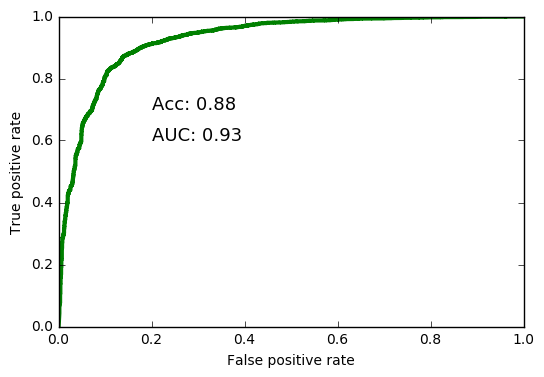

In [94]:
performance(d_test['sentiment1'], pred1) #朴素贝叶斯

In [520]:
# %90的分类是正确的


In [91]:
from sklearn.linear_model import LogisticRegression

In [92]:
#logismodel = LogisticRegression(C=0.000000001,solver='liblinear',max_iter=200)
logismodel = LogisticRegression()
logismodel.fit(features,d_train['sentiment1'])
logis_pred = logismodel.predict_proba(test_features)


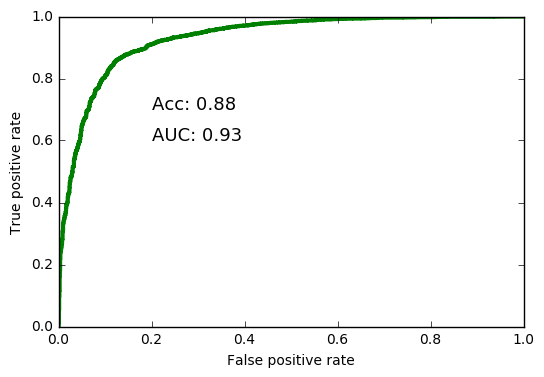

In [93]:
performance(d_test.sentiment1, logis_pred) #逻辑回归

In [ ]:
## 中文
import matplotlib as mpl 
from matplotlib.ticker import MultipleLocator, FormatStrFormatter 

mpl.rcParams['font.size'] = 14
custom_font = mpl.font_manager.FontProperties(fname='C:/Windows/WRYH.ttf') 
##

plt.title(u"简单词袋模型的分类性能的ROC曲线",fontproperties=custom_font)

In [ ]:
# tf-idf算法规范词袋特征

In [17]:
#### 在模型中使用tf-idf特征
#使用TfidifVectorzer构造特征
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
features = vectorizer.fit_transform(d_train["reviewstext"])
test_features = vectorizer.transform(d_test["reviewstext"])


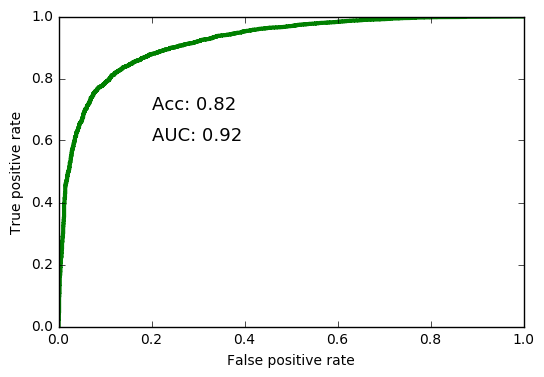

In [18]:
# 用这些特征对朴素贝叶斯算法进行训练并预测
import time
start = time.clock()
model2 = MultinomialNB()
model2.fit(features,d_train["sentiment1"])
pred2 = model2.predict_proba(test_features)
end = time.clock()
# 结果图形化
performance(d_test["sentiment1"], pred2)

In [19]:
print (str(end-start))

0.015239943589326899


In [20]:
pred222 = model2.predict(test_features)

In [35]:
#def precision_score(y_true, y_pred):
#    return ((y_true==1)&(y_pred==1)).sum()/(y_pred==1).sum()
#def recall_score(y_true, y_pred):
#    return ((y_true==1)&(y_pred==1)).sum()/(y_true==1).sum()
from sklearn.metrics import precision_score, recall_score
def f1_score(y_true, y_pred):
    num = 2*precision_score(y_true, y_pred)*recall_score(y_true, y_pred)
    deno = (precision_score(y_true, y_pred)+recall_score(y_true, y_pred))
    return num/deno

In [23]:
print("precision:", precision_score(d_test["sentiment1"],pred222),"recall:",recall_score(d_test["sentiment1"],pred222),
     "f1_score:",f1_score(d_test["sentiment1"],pred222))

precision: 0.808864265928 recall: 0.994889267462 f1_score: 0.892284186402


In [73]:
from sklearn.metrics import confusion_matrix,recall_score,classification_report 

def plot_confusion_matrix(cm, classes,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Recall metric in the testing dataset:  0.994889267462


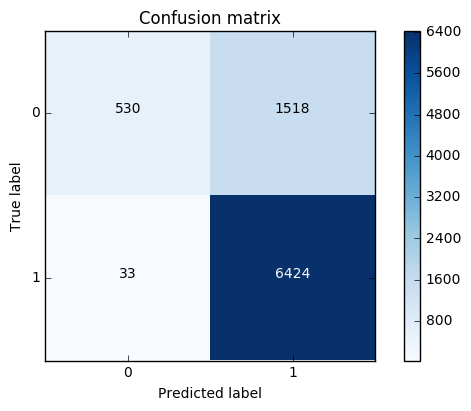

In [25]:
import itertools

# Compute confusion matrix
cnf_matrix = confusion_matrix(d_test["sentiment1"], pred222)
np.set_printoptions(precision=2)

print("Recall metric in the testing dataset: ", cnf_matrix[1,1]/(cnf_matrix[1,0]+cnf_matrix[1,1]))

# Plot non-normalized confusion matrix
class_names = [0,1]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

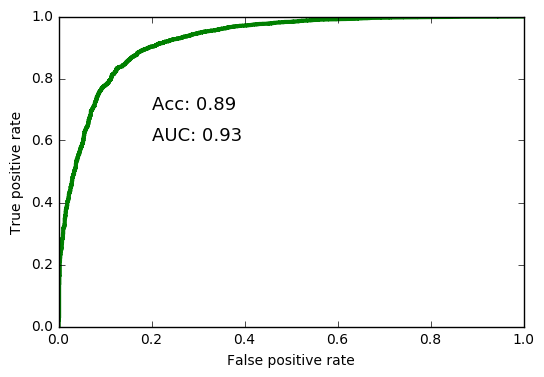

In [70]:
#逻辑回归
from sklearn.linear_model import LogisticRegression
start = time.clock()
logismodel = LogisticRegression()
logismodel.fit(features,d_train["sentiment1"])
logis_pred = logismodel.predict_proba(test_features)
end = time.clock()


performance(d_test["sentiment1"], logis_pred)

In [28]:
print (str(end-start))

0.30297930664713135


In [71]:
logis_pred222 = logismodel.predict(test_features)
print("precision:", precision_score(d_test["sentiment1"],logis_pred222),"recall:",recall_score(d_test["sentiment1"],logis_pred222),
     "f1_score:",f1_score(d_test["sentiment1"],logis_pred222))

precision: 0.90532369857 recall: 0.950751122812 f1_score: 0.927481492673


Recall metric in the testing dataset:  0.950751122812


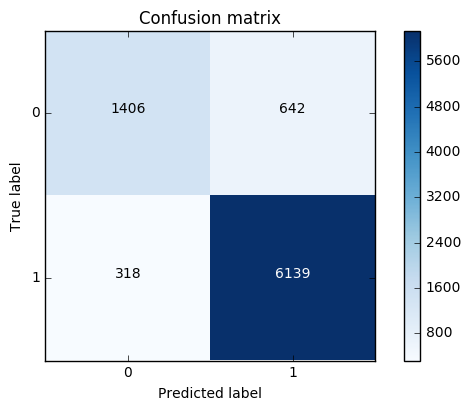

In [74]:
import itertools

# Compute confusion matrix
cnf_matrix = confusion_matrix(d_test["sentiment1"], logis_pred222)
np.set_printoptions(precision=2)

print("Recall metric in the testing dataset: ", cnf_matrix[1,1]/(cnf_matrix[1,0]+cnf_matrix[1,1]))

# Plot non-normalized confusion matrix
class_names = [0,1]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

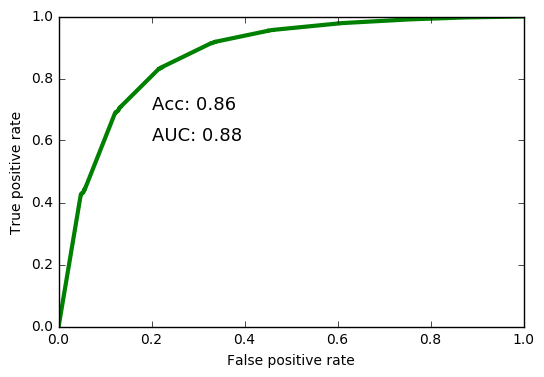

In [64]:
#随机森林
from sklearn.ensemble import RandomForestClassifier

start = time.clock()
#rfmodel = RandomForestClassifier(n_estimators = 100, n_jobs = -1) #100棵树
rfmodel = RandomForestClassifier() 
rfmodel.fit(features, d_train["sentiment1"])
rf_pred = rfmodel.predict_proba(test_features)
end = time.clock()

performance(d_test["sentiment1"], rf_pred)


In [32]:
print(str(end-start))

43.271970050237215


In [86]:
rf_pred222 = rfmodel.predict(test_features)
print("precision:", precision_score(d_test["sentiment1"],rf_pred222),"recall:",recall_score(d_test["sentiment1"],rf_pred222),
     "f1_score:",f1_score(d_test["sentiment1"],rf_pred222))

precision: 0.867003367003 recall: 0.957100820815 f1_score: 0.90982701509


Recall metric in the testing dataset:  0.957100820815


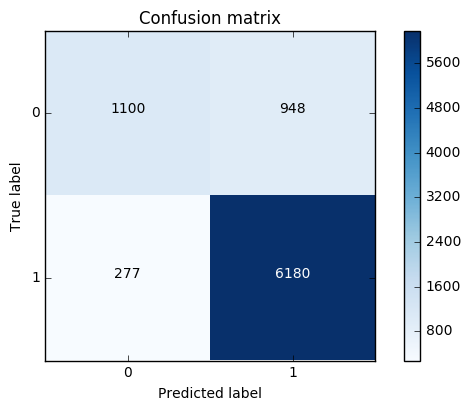

In [87]:
import itertools

# Compute confusion matrix
cnf_matrix = confusion_matrix(d_test["sentiment1"], rf_pred222)
np.set_printoptions(precision=2)

print("Recall metric in the testing dataset: ", cnf_matrix[1,1]/(cnf_matrix[1,0]+cnf_matrix[1,1]))

# Plot non-normalized confusion matrix
class_names = [0,1]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

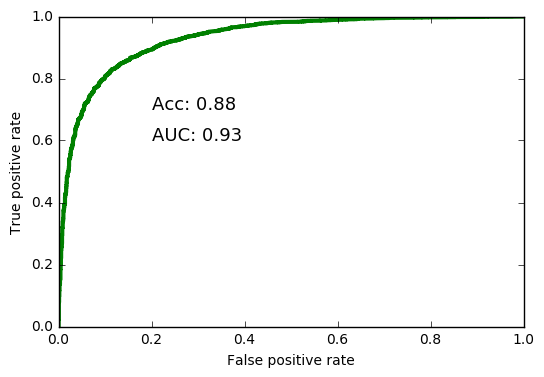

In [34]:
#支持向量机
from sklearn.svm import SVC, LinearSVC, NuSVC

start = time.clock()
#svmmodel=SVC(kernel="rbf", C=0.025, probability=True)
svmmodel=SVC(probability=True)
svm_fit = svmmodel.fit(features,d_train.sentiment1)
svm_pred = svm_fit.predict_proba(test_features)
end = time.clock()

performance(d_test.sentiment1, svm_pred)


In [35]:
print(str(end-start))

710.2700462726101


In [54]:
svm_pred222 = svm_fit.predict(test_features)
print("precision:", precision_score(d_test.sentiment1,svm_pred222),"recall:",recall_score(d_test.sentiment1,svm_pred222),
      "f1_score:",f1_score(d_test["sentiment1"],rf_pred222))

NameError: name 'svm_fit' is not defined

In [59]:
from sklearn.svm import SVC, LinearSVC, NuSVC
import time
start = time.clock()
#svmmodel=SVC(kernel="rbf", C=0.025, probability=True)
linearsvcmodel=LinearSVC()
linearsvcmodel.fit(features,d_train.sentiment1)
linearsvc_pred = linearsvcmodel.predict(test_features)
end = time.clock()

#performance(d_test.sentiment1, linearsvc_pred)


In [60]:
print(str(end-start))

2.8346846345084487


In [81]:
print("precision:", precision_score(d_test.sentiment1,linearsvc_pred),"recall:",recall_score(d_test.sentiment1,linearsvc_pred),
      "f1_score:",f1_score(d_test["sentiment1"],linearsvc_pred))

precision: 0.905614933012 recall: 0.931702028806 f1_score: 0.918473282443


Recall metric in the testing dataset:  0.931702028806


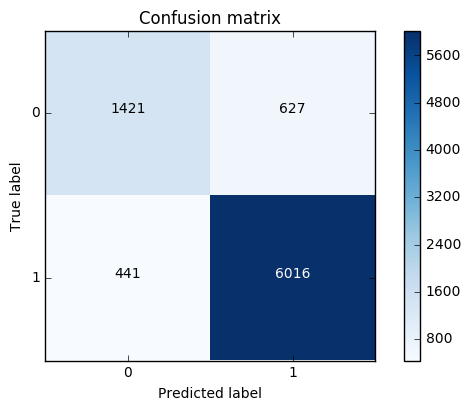

In [82]:
import itertools

# Compute confusion matrix
cnf_matrix = confusion_matrix(d_test["sentiment1"], linearsvc_pred)
np.set_printoptions(precision=2)

print("Recall metric in the testing dataset: ", cnf_matrix[1,1]/(cnf_matrix[1,0]+cnf_matrix[1,1]))

# Plot non-normalized confusion matrix
class_names = [0,1]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [ ]:
# 优化模型参数

In [80]:
# 参数优化的模型构建方法
def build_model(max_features = None, min_df = 1, nb_alpha = 1):
    vectorizer = TfidfVectorizer(max_features = max_features, min_df = min_df)
    features = vectorizer.fit_transform(d_train.reviewstext)
    model = MultinomialNB(nb_alpha)
    model.fit(features, d_train.sentiment1)
    pred = model.predict_proba(vectorizer.transform(d_test.reviewstext))
    return{
        "max_features":max_features,
        "min_df":min_df,
        "nb_alpha":nb_alpha,
        "auc":roc_auc_score(d_test.sentiment1, pred[:,1])
    }
    

In [81]:
# 参数优化循环
from itertools import product

#定义想要优化的参数值
param_values = {
    "max_features":[10000,30000,50000,None],
    "min_df":[1,2,3],
    "nb_alpha":[0.01,0.1,1]
}

results = []
for p in product(*param_values.values()): # 对每个参数值组合
    #构建模型并保存结果
    res = build_model(**dict(zip(param_values.keys(),p)))
    results.append(res)
    print (res)


{'max_features': 10000, 'auc': 0.93835496454619771, 'nb_alpha': 0.01, 'min_df': 1}
{'max_features': 10000, 'auc': 0.93862034306873676, 'nb_alpha': 0.01, 'min_df': 2}
{'max_features': 10000, 'auc': 0.93754107882460636, 'nb_alpha': 0.01, 'min_df': 3}
{'max_features': 10000, 'auc': 0.94330005056699684, 'nb_alpha': 0.1, 'min_df': 1}
{'max_features': 10000, 'auc': 0.94371043441573743, 'nb_alpha': 0.1, 'min_df': 2}
{'max_features': 10000, 'auc': 0.94248480722581762, 'nb_alpha': 0.1, 'min_df': 3}
{'max_features': 10000, 'auc': 0.9413611964822749, 'nb_alpha': 1, 'min_df': 1}
{'max_features': 10000, 'auc': 0.94201147460075718, 'nb_alpha': 1, 'min_df': 2}
{'max_features': 10000, 'auc': 0.94222938698738379, 'nb_alpha': 1, 'min_df': 3}
{'max_features': 30000, 'auc': 0.94411742421550815, 'nb_alpha': 0.01, 'min_df': 1}
{'max_features': 30000, 'auc': 0.93997430863800202, 'nb_alpha': 0.01, 'min_df': 2}
{'max_features': 30000, 'auc': 0.93754107882460636, 'nb_alpha': 0.01, 'min_df': 3}
{'max_features': 

In [82]:
# max_features 为 30000，50000，None，min_df 为 1，nb_alpha 为 0.1 时结果最佳

In [ ]:
###### word2vec特征

In [95]:
# 文档划分
import re,string
from itertools import chain

stop_words=[['hotel','night','stay'],stopwords.words('english')]
stop_words_new = list(chain(*stop_words))

def tokenize(docs):
    pattern = re.compile('[\W_]+', re.UNICODE)
    sentences = []
    for d in docs:
        sentence = d.lower().split(" ")
        sentence = [pattern.sub(' ',w) for w in sentence] #删除任何非单词字符，如标点符号
        sentences.append( [w for w in sentence if w not in stop_words_new] )
    return(sentences)

In [244]:
#d_train_new = d_train.drop(2141)
#d_train_new = d_train_new.drop(7631)
#d_train_new = d_train_new.drop(8419)
#d_train_new = d_train_new.drop(16526)
d_train_new = d_train

In [235]:
d_train_new = d_train_new.drop(2140)

In [245]:
# word2vec模型
from gensim.models.word2vec import Word2Vec
sentences_w2v = tokenize(d_train_new.reviewstext) #切分函数产生句子

#构建并规范word2vec模型
model_w2v = Word2Vec(sentences_w2v, size = 100, window = 10, min_count = 10, sample = 1e-3, workers = 2)
model_w2v.init_sims(replace = True)
# size为向量长度


features_w2v = featurize_w2v(model_w2v, sentences_w2v)



D:\Anaconda\Anaconda\lib\site-packages\ipykernel\__main__.py:9: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



In [247]:
features_w2v = np.nan_to_num(features_w2v)

In [210]:
print(len(sentences_w2v))
print(sentences_w2v[0])
print(sentences_w2v[1])

17217
['wonderful ', 'relaxing', 'time ', 'staff', 'completely', 'attentive', 'accommodating ', 'corner', 'king', 'room', 'kitchen ', 'two', 'patios', 'deluxe', 'bathroom ', 'drive', 'town', 'said', 'uber', 'available', 'need', 'it ', 'first', 'visit', 'palm', 'springs', 'hopefully', 'last ', 'really ']
['palm', 'springs', 'day', 'temperature', '123', 'degrees ', 'despite', 'that ', 'wonderful', 'little', 'paradise', 'hotel ', 'staff', 'friendly', 'accommodating ', 'little', 'complimentary', 'touches', 'nice ', 'like', 'bottle', 'wine', 'us', 'fridge ', 'sun', 'care', 'products', 'near', 'pool ', 'a ']


In [42]:
model_w2v.most_similar("clean")

D:\Anaconda\Anaconda\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning:

Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).



[('clean ', 0.976184606552124),
 ('older', 0.8641722202301025),
 ('spacious ', 0.8531026840209961),
 ('quiet ', 0.8487958908081055),
 ('spacious', 0.8448096513748169),
 ('comfy', 0.8378585577011108),
 ('nice ', 0.8353925347328186),
 ('spotless ', 0.8135238885879517),
 ('comfortable', 0.8132413625717163),
 ('nice', 0.8110310435295105)]

In [167]:
#model2_w2v = Word2Vec(size = 300,min_count = 10)
#model2_w2v.build_vocab(sentences_w2v)

#model2_w2v.train(sentences_w2v,total_examples=model2_w2v.corpus_count, epochs=model.iter)

In [488]:
#打印word2vec产生的单词room的向量
#print(model['room'])
#points = np.array([model_w2v['room'],model_w2v['staff']])


In [152]:
#model_w2v.wv['room']

Original cluster by hierarchy clustering:
 [1 1 1 1 1 1 1 1 1 1 1 1 1]


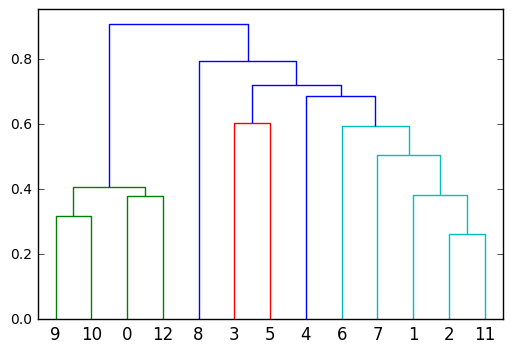

In [82]:
# 导入相应的包
import scipy
import scipy.cluster.hierarchy as sch
from scipy.cluster.vq import vq,kmeans,whiten


#1. 层次聚类
#生成点与点之间的距离矩阵,这里用的欧氏距离:
disMat = sch.distance.pdist(tt,'euclidean') 
#进行层次聚类:
Z=sch.linkage(disMat,method='average') 
#将层级聚类结果以树状图表示出来并保存为plot_dendrogram.png
P=sch.dendrogram(Z)
#plt.savefig('plot_dendrogram.png')
#根据linkage matrix Z得到聚类结果:
cluster= sch.fcluster(Z,t=2) 

print ("Original cluster by hierarchy clustering:\n",cluster)



In [100]:
# word2vec特征 把评论文档（单词的列表）表示成文档中所有单词的平均向量
from numpy import *

def featurize_w2v(model, sentences):
    f = zeros((len(sentences),model.vector_size))
    for i,s in enumerate(sentences):
        for w in s:
            try:
                vec = model[w]
            except KeyError:
                continue
            f[i,:] = f[i,:] + vec
        f[i,:] = f[i,:]/len(s)
    return(f)

In [170]:

test_sentences = tokenize(d_test["reviewstext"])
test_features_w2v = featurize_w2v(model_w2v, test_sentences)

D:\Anaconda\Anaconda\lib\site-packages\ipykernel\__main__.py:9: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



In [216]:
features_w2v.shape

(17217, 100)

In [ ]:
# 对word2vec特征构建随机森林模型
from sklearn.ensemble import RandomForestClassifier

#rfmodel_w2v = RandomForestClassifier(n_estimators = 100, n_jobs = -1)
rfmodel_w2v = RandomForestClassifier()
rfmodel_w2v.fit(features_w2v,d_train_new["sentiment1"])
rf_pred_w2v = rfmodel_w2v.predict_proba(test_features_w2v)


In [239]:
d_train_new.iloc[2139]

index                                                     2861
latitude                                               32.2236
longitude                                             -110.909
name               La Quinta Inn and Suites Tucson - Reid Park
province                                                    AZ
reviewsdate                               2016-09-19T00:00:00Z
reviewsrating                                                4
reviewstext                                    will stay again
reviewsusername                                     A Traveler
new_date                                            2016-09-19
new_time                                              00:00:00
day                                                         19
month                                                        9
year                                                      2016
sentiment                                             positive
sentiment1                                             

In [240]:
features_w2v[2139]

AttributeError: 'numpy.ndarray' object has no attribute 'isnull'

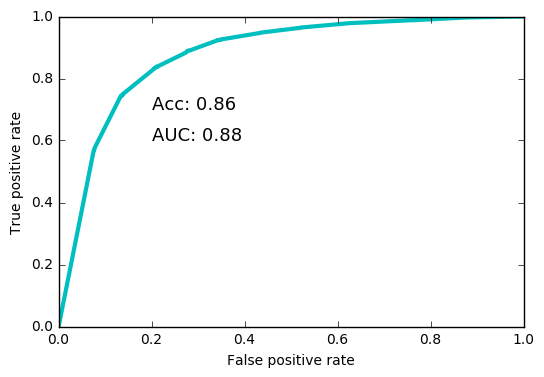

In [67]:
performance(d_test.sentiment1, rf_pred_w2v, color="c")


In [68]:
rf_pred333 = rfmodel_w2v.predict(test_features_w2v)
print("precision:", precision_score(d_test.sentiment1,rf_pred333),"recall:",recall_score(d_test.sentiment1,rf_pred333),
     "f1_score:",f1_score(d_test.sentiment1,rf_pred333))

precision: 0.893305439331 recall: 0.925816942853 f1_score: 0.909270666971


In [189]:
# 对word2vec特征构建朴素贝叶斯模型
nbmodel_w2v = MultinomialNB()
nbmodel_w2v.fit(features_w2v,d_train_new.sentiment1)
nb_pred_w2v = nbmodel_w2v.predict_proba(test_features_w2v)

# 结果图形化
performance(d_test.sentiment1, nb_pred2_w2v,color = "c")

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

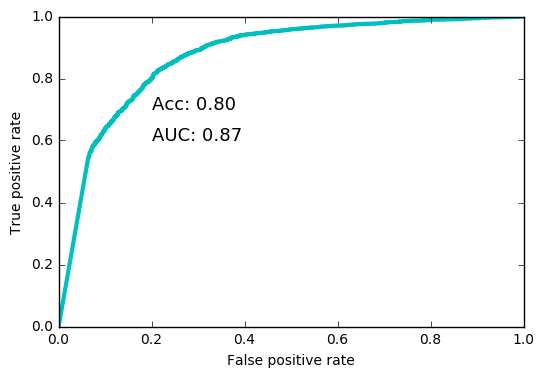

In [52]:
from sklearn.naive_bayes import GaussianNB
modelGNB_w2v = GaussianNB()
modelGNB_w2v.fit(features_w2v, d_train_new["sentiment1"])
GNBpred_w2v = modelGNB_w2v.predict_proba(test_features_w2v)

# 结果图形化
performance(d_test["sentiment1"], GNBpred_w2v,color="c")

In [53]:
GNB_pred333 = modelGNB_w2v.predict(test_features_w2v)
print("precision:", precision_score(d_test.sentiment1,GNB_pred333),"recall:",recall_score(d_test.sentiment1,GNB_pred333),
     "f1_score:",f1_score(d_test.sentiment1,GNB_pred333))

precision: 0.926344086022 recall: 0.800526560322 f1_score: 0.85885187339


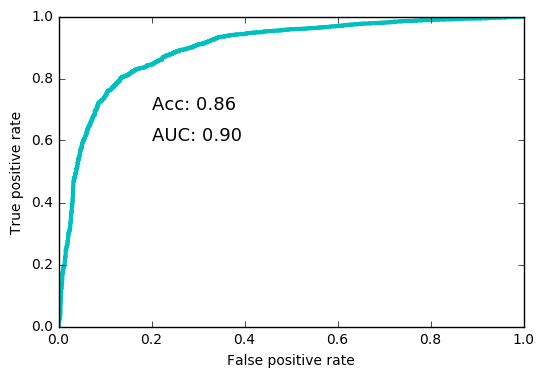

In [75]:
#逻辑回归
from sklearn.linear_model import LogisticRegression
logismodel_w2v = LogisticRegression()
logismodel_w2v.fit(features_w2v,d_train_new['sentiment1'])
logis_pred_w2v = logismodel_w2v.predict_proba(test_features_w2v)

performance(d_test.sentiment1, logis_pred_w2v,color="c")

In [76]:
logis_pred333 = logismodel_w2v.predict(test_features_w2v)
print("precision:", precision_score(d_test.sentiment1,logis_pred333),"recall:",recall_score(d_test.sentiment1,logis_pred333),
     "f1_score:",f1_score(d_test.sentiment1,logis_pred333))

precision: 0.873432155074 recall: 0.9490475453 f1_score: 0.90967119424


Recall metric in the testing dataset:  0.9490475453


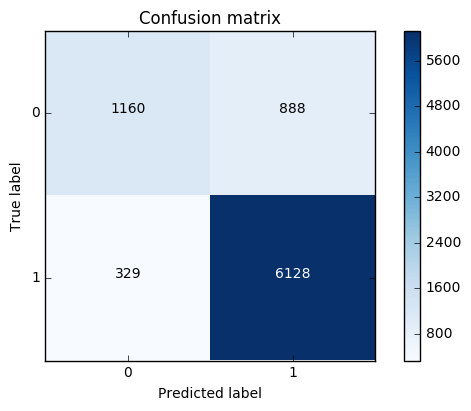

In [78]:
import itertools

# Compute confusion matrix
cnf_matrix = confusion_matrix(d_test["sentiment1"], logis_pred333)
np.set_printoptions(precision=2)

print("Recall metric in the testing dataset: ", cnf_matrix[1,1]/(cnf_matrix[1,0]+cnf_matrix[1,1]))

# Plot non-normalized confusion matrix
class_names = [0,1]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

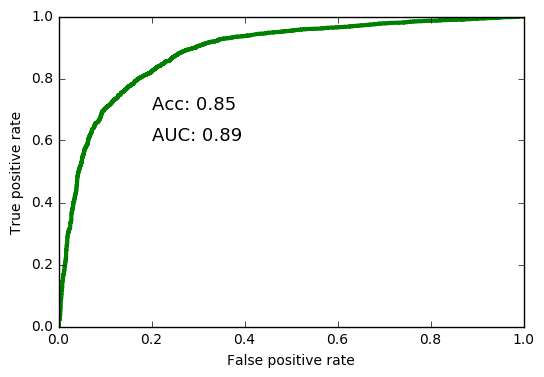

In [41]:
# 支持向量机
from sklearn.svm import SVC, LinearSVC, NuSVC

svmmodel_w2v=SVC(probability=True)
svmmodel_w2v.fit(features_w2v,d_train_new.sentiment1)
svm_pred_w2v = svmmodel_w2v.predict_proba(test_features_w2v)

performance(d_test.sentiment1, svm_pred_w2v)


In [42]:
svm_pred333 = svmmodel_w2v.predict(test_features_w2v)
print("precision:", precision_score(d_test.sentiment1,svm_pred333),"recall:",recall_score(d_test.sentiment1,svm_pred333),
     "f1_score:",f1_score(d_test.sentiment1,svm_pred333))

precision: 0.840540540541 recall: 0.963295648134 f1_score: 0.897741213827


In [62]:
from sklearn.svm import SVC, LinearSVC, NuSVC

linearsvcmodel_w2v=LinearSVC()
linearsvcmodel_w2v.fit(features_w2v,d_train_new.sentiment1)
linearsvc_pred_w2v = linearsvcmodel_w2v.predict(test_features_w2v)


#performance(d_test.sentiment1, linearsvc_pred)


In [63]:
print("precision:", precision_score(d_test.sentiment1,linearsvc_pred_w2v),"recall:",recall_score(d_test.sentiment1,linearsvc_pred_w2v),
      "f1_score:",f1_score(d_test["sentiment1"],linearsvc_pred_w2v))

precision: 0.877898654452 recall: 0.949821898715 f1_score: 0.912445138734


In [416]:
# 参数优化的模型构建方法
def build_model(size = 100, window = 5, min_count = 5):    
    model_w2v = Word2Vec(sentences_w2v, size = size, window = window, min_count = min_count, sample = 1e-3, workers = 2)
    model_w2v.init_sims(replace = True)
    features_w2v = featurize_w2v(model_w2v, sentences_w2v)
    test_features_w2v = featurize_w2v(model_w2v, test_sentences)
    
    logismodel_w2v = LogisticRegression()
    logismodel_w2v.fit(features_w2v,d_train_new['sentiment1'])
    logis_pred_w2v = logismodel_w2v.predict_proba(test_features_w2v)
    
    return{
        "size":size,
        "window":window,
        "min_count":min_count,
        "auc":roc_auc_score(d_test.sentiment1, logis_pred_w2v[:,1])
    }
    

# 参数优化循环
from itertools import product

#定义想要优化的参数值
param_values = {
    "size":[100,200,300],
    "window":[5,10],
    "min_count":[5,10]
}

results = []
for p in product(*param_values.values()): # 对每个参数值组合
    #构建模型并保存结果
    res = build_model(**dict(zip(param_values.keys(),p)))
    results.append(res)
    print (res)


2018-02-17 19:09:20,520 : INFO : collecting all words and their counts
2018-02-17 19:09:20,521 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2018-02-17 19:09:20,592 : INFO : PROGRESS: at sentence #10000, processed 251750 words, keeping 23307 word types
2018-02-17 19:09:20,674 : INFO : collected 34340 word types from a corpus of 490768 raw words and 19838 sentences
2018-02-17 19:09:20,675 : INFO : Loading a fresh vocabulary
2018-02-17 19:09:20,720 : INFO : min_count=5 retains 7806 unique words (22% of original 34340, drops 26534)
2018-02-17 19:09:20,721 : INFO : min_count=5 leaves 451178 word corpus (91% of original 490768, drops 39590)
2018-02-17 19:09:20,751 : INFO : deleting the raw counts dictionary of 34340 items
2018-02-17 19:09:20,753 : INFO : sample=0.001 downsamples 39 most-common words
2018-02-17 19:09:20,754 : INFO : downsampling leaves estimated 417026 word corpus (92.4% of prior 451178)
2018-02-17 19:09:20,755 : INFO : estimated required memory 

{'min_count': 5, 'window': 5, 'size': 100, 'auc': 0.8922302709269011}


2018-02-17 19:09:31,644 : INFO : min_count=5 leaves 451178 word corpus (91% of original 490768, drops 39590)
2018-02-17 19:09:31,683 : INFO : deleting the raw counts dictionary of 34340 items
2018-02-17 19:09:31,687 : INFO : sample=0.001 downsamples 39 most-common words
2018-02-17 19:09:31,688 : INFO : downsampling leaves estimated 417026 word corpus (92.4% of prior 451178)
2018-02-17 19:09:31,689 : INFO : estimated required memory for 7806 words and 200 dimensions: 16392600 bytes
2018-02-17 19:09:31,730 : INFO : resetting layer weights
2018-02-17 19:09:31,917 : INFO : training model with 2 workers on 7806 vocabulary and 200 features, using sg=0 hs=0 sample=0.001 negative=5 window=5
2018-02-17 19:09:32,925 : INFO : PROGRESS: at 21.53% examples, 448374 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:09:33,928 : INFO : PROGRESS: at 43.89% examples, 456931 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:09:34,943 : INFO : PROGRESS: at 70.20% examples, 485751 words/s, in_qsize 3, out_qsize 0

{'min_count': 5, 'window': 5, 'size': 200, 'auc': 0.89059883532406681}


2018-02-17 19:09:43,533 : INFO : deleting the raw counts dictionary of 34340 items
2018-02-17 19:09:43,536 : INFO : sample=0.001 downsamples 39 most-common words
2018-02-17 19:09:43,537 : INFO : downsampling leaves estimated 417026 word corpus (92.4% of prior 451178)
2018-02-17 19:09:43,537 : INFO : estimated required memory for 7806 words and 300 dimensions: 22637400 bytes
2018-02-17 19:09:43,576 : INFO : resetting layer weights
2018-02-17 19:09:43,712 : INFO : training model with 2 workers on 7806 vocabulary and 300 features, using sg=0 hs=0 sample=0.001 negative=5 window=5
2018-02-17 19:09:44,732 : INFO : PROGRESS: at 19.92% examples, 409414 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:09:45,737 : INFO : PROGRESS: at 43.47% examples, 449121 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:09:46,740 : INFO : PROGRESS: at 69.41% examples, 479709 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:09:47,743 : INFO : PROGRESS: at 95.32% examples, 494890 words/s, in_qsize 3, out_qsize 0
2018-

{'min_count': 5, 'window': 5, 'size': 300, 'auc': 0.8894035784807186}


2018-02-17 19:09:55,348 : INFO : sample=0.001 downsamples 39 most-common words
2018-02-17 19:09:55,349 : INFO : downsampling leaves estimated 417026 word corpus (92.4% of prior 451178)
2018-02-17 19:09:55,350 : INFO : estimated required memory for 7806 words and 100 dimensions: 10147800 bytes
2018-02-17 19:09:55,386 : INFO : resetting layer weights
2018-02-17 19:09:55,534 : INFO : training model with 2 workers on 7806 vocabulary and 100 features, using sg=0 hs=0 sample=0.001 negative=5 window=10
2018-02-17 19:09:56,542 : INFO : PROGRESS: at 24.71% examples, 516652 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:09:57,544 : INFO : PROGRESS: at 56.39% examples, 588147 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:09:58,558 : INFO : PROGRESS: at 91.69% examples, 634709 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:09:58,796 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-02-17 19:09:58,807 : INFO : worker thread finished; awaiting finish of 0 more threads
2018-02-

{'min_count': 5, 'window': 10, 'size': 100, 'auc': 0.89921374392616538}


2018-02-17 19:10:05,254 : INFO : deleting the raw counts dictionary of 34340 items
2018-02-17 19:10:05,257 : INFO : sample=0.001 downsamples 39 most-common words
2018-02-17 19:10:05,257 : INFO : downsampling leaves estimated 417026 word corpus (92.4% of prior 451178)
2018-02-17 19:10:05,258 : INFO : estimated required memory for 7806 words and 200 dimensions: 16392600 bytes
2018-02-17 19:10:05,295 : INFO : resetting layer weights
2018-02-17 19:10:05,461 : INFO : training model with 2 workers on 7806 vocabulary and 200 features, using sg=0 hs=0 sample=0.001 negative=5 window=10
2018-02-17 19:10:06,482 : INFO : PROGRESS: at 22.34% examples, 459291 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:07,482 : INFO : PROGRESS: at 49.85% examples, 517764 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:08,493 : INFO : PROGRESS: at 80.09% examples, 551858 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:09,161 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-02-17 19:10

{'min_count': 5, 'window': 10, 'size': 200, 'auc': 0.89806204446240512}


2018-02-17 19:10:16,127 : INFO : deleting the raw counts dictionary of 34340 items
2018-02-17 19:10:16,129 : INFO : sample=0.001 downsamples 39 most-common words
2018-02-17 19:10:16,130 : INFO : downsampling leaves estimated 417026 word corpus (92.4% of prior 451178)
2018-02-17 19:10:16,131 : INFO : estimated required memory for 7806 words and 300 dimensions: 22637400 bytes
2018-02-17 19:10:16,164 : INFO : resetting layer weights
2018-02-17 19:10:16,341 : INFO : training model with 2 workers on 7806 vocabulary and 300 features, using sg=0 hs=0 sample=0.001 negative=5 window=10
2018-02-17 19:10:17,355 : INFO : PROGRESS: at 21.94% examples, 453105 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:18,356 : INFO : PROGRESS: at 46.27% examples, 481141 words/s, in_qsize 4, out_qsize 0
2018-02-17 19:10:19,357 : INFO : PROGRESS: at 70.95% examples, 492782 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:20,363 : INFO : PROGRESS: at 95.76% examples, 497903 words/s, in_qsize 3, out_qsize 0
2018

{'min_count': 5, 'window': 10, 'size': 300, 'auc': 0.89700509742333889}


2018-02-17 19:10:27,907 : INFO : training model with 2 workers on 4818 vocabulary and 100 features, using sg=0 hs=0 sample=0.001 negative=5 window=5
2018-02-17 19:10:28,927 : INFO : PROGRESS: at 42.70% examples, 835673 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:29,931 : INFO : PROGRESS: at 85.31% examples, 839085 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:30,266 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-02-17 19:10:30,276 : INFO : worker thread finished; awaiting finish of 0 more threads
2018-02-17 19:10:30,277 : INFO : training on 2453840 raw words (1979734 effective words) took 2.4s, 838409 effective words/s
2018-02-17 19:10:30,277 : INFO : precomputing L2-norms of word weight vectors
2018-02-17 19:10:36,263 : INFO : collecting all words and their counts
2018-02-17 19:10:36,264 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2018-02-17 19:10:36,326 : INFO : PROGRESS: at sentence #10000, processed 251750 words, kee

{'min_count': 10, 'window': 5, 'size': 100, 'auc': 0.89455609131804625}


2018-02-17 19:10:36,545 : INFO : training model with 2 workers on 4818 vocabulary and 200 features, using sg=0 hs=0 sample=0.001 negative=5 window=5
2018-02-17 19:10:37,550 : INFO : PROGRESS: at 36.97% examples, 731427 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:38,555 : INFO : PROGRESS: at 74.65% examples, 737845 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:39,209 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-02-17 19:10:39,221 : INFO : worker thread finished; awaiting finish of 0 more threads
2018-02-17 19:10:39,222 : INFO : training on 2453840 raw words (1979734 effective words) took 2.7s, 740539 effective words/s
2018-02-17 19:10:39,222 : INFO : precomputing L2-norms of word weight vectors
2018-02-17 19:10:45,735 : INFO : collecting all words and their counts
2018-02-17 19:10:45,735 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2018-02-17 19:10:45,803 : INFO : PROGRESS: at sentence #10000, processed 251750 words, kee

{'min_count': 10, 'window': 5, 'size': 200, 'auc': 0.89358807392897244}


2018-02-17 19:10:46,035 : INFO : training model with 2 workers on 4818 vocabulary and 300 features, using sg=0 hs=0 sample=0.001 negative=5 window=5
2018-02-17 19:10:47,041 : INFO : PROGRESS: at 29.93% examples, 595080 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:48,042 : INFO : PROGRESS: at 59.77% examples, 591346 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:49,044 : INFO : PROGRESS: at 90.09% examples, 595040 words/s, in_qsize 4, out_qsize 0
2018-02-17 19:10:49,341 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-02-17 19:10:49,348 : INFO : worker thread finished; awaiting finish of 0 more threads
2018-02-17 19:10:49,349 : INFO : training on 2453840 raw words (1979734 effective words) took 3.3s, 598250 effective words/s
2018-02-17 19:10:49,350 : INFO : precomputing L2-norms of word weight vectors
2018-02-17 19:10:56,188 : INFO : collecting all words and their counts
2018-02-17 19:10:56,188 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 

{'min_count': 10, 'window': 5, 'size': 300, 'auc': 0.8926402472002285}


2018-02-17 19:10:56,414 : INFO : resetting layer weights
2018-02-17 19:10:56,496 : INFO : training model with 2 workers on 4818 vocabulary and 100 features, using sg=0 hs=0 sample=0.001 negative=5 window=10
2018-02-17 19:10:57,511 : INFO : PROGRESS: at 38.58% examples, 757678 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:58,512 : INFO : PROGRESS: at 77.68% examples, 764926 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:10:59,074 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-02-17 19:10:59,080 : INFO : worker thread finished; awaiting finish of 0 more threads
2018-02-17 19:10:59,081 : INFO : training on 2453840 raw words (1979108 effective words) took 2.6s, 767419 effective words/s
2018-02-17 19:10:59,082 : INFO : precomputing L2-norms of word weight vectors
2018-02-17 19:11:05,332 : INFO : collecting all words and their counts
2018-02-17 19:11:05,332 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2018-02-17 19:11:05,394 : INFO :

{'min_count': 10, 'window': 10, 'size': 100, 'auc': 0.90012152962627767}


2018-02-17 19:11:05,694 : INFO : min_count=10 leaves 431686 word corpus (87% of original 490768, drops 59082)
2018-02-17 19:11:05,712 : INFO : deleting the raw counts dictionary of 34340 items
2018-02-17 19:11:05,714 : INFO : sample=0.001 downsamples 43 most-common words
2018-02-17 19:11:05,715 : INFO : downsampling leaves estimated 395862 word corpus (91.7% of prior 431686)
2018-02-17 19:11:05,716 : INFO : estimated required memory for 4818 words and 200 dimensions: 10117800 bytes
2018-02-17 19:11:05,736 : INFO : resetting layer weights
2018-02-17 19:11:05,814 : INFO : training model with 2 workers on 4818 vocabulary and 200 features, using sg=0 hs=0 sample=0.001 negative=5 window=10
2018-02-17 19:11:06,824 : INFO : PROGRESS: at 32.32% examples, 639385 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:11:07,831 : INFO : PROGRESS: at 66.21% examples, 651809 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:11:08,826 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-02-1

{'min_count': 10, 'window': 10, 'size': 200, 'auc': 0.89913256537236719}


2018-02-17 19:11:15,612 : INFO : training model with 2 workers on 4818 vocabulary and 300 features, using sg=0 hs=0 sample=0.001 negative=5 window=10
2018-02-17 19:11:16,626 : INFO : PROGRESS: at 27.15% examples, 533781 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:11:17,629 : INFO : PROGRESS: at 54.31% examples, 535567 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:11:18,631 : INFO : PROGRESS: at 81.72% examples, 536432 words/s, in_qsize 3, out_qsize 0
2018-02-17 19:11:19,276 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-02-17 19:11:19,287 : INFO : worker thread finished; awaiting finish of 0 more threads
2018-02-17 19:11:19,288 : INFO : training on 2453840 raw words (1979108 effective words) took 3.7s, 538979 effective words/s
2018-02-17 19:11:19,288 : INFO : precomputing L2-norms of word weight vectors


{'min_count': 10, 'window': 10, 'size': 300, 'auc': 0.89847678482412496}


In [ ]:
#对评论进行打分 排名

In [59]:
import pickle
import jieba

In [60]:
#coding=utf-8


"""

input: An excel file with product review

	手机很好，很喜欢。

    三防出色，操作系统垃圾！

    Defy用过3年感受。。。

    刚买很兴奋。当时还流行，机还很贵

    ……

output:

    parameter_1: Every cell is a value of the data list. (unicode)

    parameter_2: Excel row number. (int)

"""

def get_excel_data(filepath, sheetnum, colnum, para):

    table = xlrd.open_workbook(filepath)

    sheet = table.sheets()[sheetnum-1]

    data = sheet.col_values(colnum-1)

    rownum = sheet.nrows

    if para == 'data':

        return data

    elif para == 'rownum':

        return rownum





"""

input:

    parameter_1: A txt file with many lines

    parameter_2: A txt file with only one line of data

output:

    parameter_1: Every line is a value of the txt_data list. (unicode)

    parameter_2: Txt data is a string. (str)

"""



def get_txt_data(filepath, para):

    if para == 'lines':

        txt_file1 = open(filepath, 'r')

        txt_tmp1 = txt_file1.readlines()

        txt_tmp2 = ''.join(txt_tmp1)

        txt_data1 = txt_tmp2.decode('utf8').split('\n')

        txt_file1.close()

        return txt_data1

    elif para == 'line':

        txt_file2 = open(filepath, 'r')

        txt_tmp = txt_file2.readline()

        txt_data2 = txt_tmp.decode('utf8')

        txt_file2.close()

        return txt_data2





"""

input: 这款手机大小合适。

output:

    parameter_1: 这 款 手机 大小 合适 。(unicode)

    parameter_2: [u'\u8fd9', u'\u6b3e', u'\u624b\u673a', u'\u5927\u5c0f', u'\u5408\u9002', u'\uff0c']

"""



def segmentation(sentence, para):

    if para == 'str':

        seg_list = jieba.cut(sentence)

        seg_result = ' '.join(seg_list)

        return seg_result

    elif para == 'list':

        seg_list2 = jieba.cut(sentence)

        seg_result2 = []

        for w in seg_list2:

            seg_result2.append(w)

        return seg_result2





"""

input: '这款手机大小合适。'

output:

    parameter_1: 这 r 款 m 手机 n 大小 b 合适 a 。 x

    parameter_2: [(u'\u8fd9', ['r']), (u'\u6b3e', ['m']),

    (u'\u624b\u673a', ['n']), (u'\u5927\u5c0f', ['b']),

    (u'\u5408\u9002', ['a']), (u'\u3002', ['x'])]

"""



def postagger(sentence, para):

    if para == 'list':

        pos_data1 = jieba.posseg.cut(sentence)

        pos_list = []

        for w in pos_data1:

             pos_list.append((w.word, w.flag)) #make every word and tag as a tuple and add them to a list

        return pos_list

    elif para == 'str':

        pos_data2 = jieba.posseg.cut(sentence)

        pos_list2 = []

        for w2 in pos_data2:

            pos_list2.extend([w2.word.encode('utf8'), w2.flag])

        pos_str = ' '.join(pos_list2)

        return pos_str





"""

input: A review like this

    '这款手机大小合适，配置也还可以，很好用，只是屏幕有点小。。。总之，戴妃+是一款值得购买的智能手机。'

output: A multidimentional list

    [u'\u8fd9\u6b3e\u624b\u673a\u5927\u5c0f\u5408\u9002\uff0c',

    u'\u914d\u7f6e\u4e5f\u8fd8\u53ef\u4ee5\uff0c', u'\u5f88\u597d\u7528\uff0c',

    u'\u53ea\u662f\u5c4f\u5e55\u6709\u70b9\u5c0f\u3002', u'\u603b\u4e4b\uff0c',

    u'\u6234\u5983+\u662f\u4e00\u6b3e\u503c\u5f97\u8d2d\u4e70\u7684\u667a\u80fd\u624b\u673a\u3002']

"""



""" Maybe this algorithm will have bugs in it """

def cut_sentences_1(words):

    #words = (words).decode('utf8')

    start = 0

    i = 0 #i is the position of words

    sents = []

    punt_list = ',.!?:;~，。！？：；～ '.decode('utf8') # Sentence cutting punctuations

    for word in words:

        if word in punt_list and token not in punt_list:

            sents.append(words[start:i+1])

            start = i+1

            i += 1

        else:

            i += 1

            token = list(words[start:i+2]).pop()

    # if there is no punctuations in the end of a sentence, it can still be cutted

    if start < len(words):

        sents.append(words[start:])

    return sents



""" Sentence cutting algorithm without bug, but a little difficult to explain why"""

def cut_sentence_2(words):

    #words = (words).decode('utf8')

    start = 0

    i = 0 #i is the position of words

    token = 'meaningless'

    sents = []

    punt_list = ',.!?;~，。！？；～… '#.decode('utf8')

    for word in words:

        if word not in punt_list:

            i += 1

            token = list(words[start:i+2]).pop()

            #print token

        elif word in punt_list and token in punt_list:

            i += 1

            token = list(words[start:i+2]).pop()

        else:

            sents.append(words[start:i+1])

            start = i+1

            i += 1

    if start < len(words):

        sents.append(words[start:])

    return sents





"""

input: An excel file with product reviews

    手机很好，很喜欢。

    三防出色，操作系统垃圾！

    Defy用过3年感受。。。

    刚买很兴奋。当时还流行，机还很贵

output: A multidimentional list of reviews



"""

 

def seg_fil_excel(filepath, sheetnum, colnum):

    # Read product review data from excel file and segment every review

    review_data = []

    for cell in get_excel_data(filepath, sheetnum, colnum, 'data')[0:get_excel_data(filepath, sheetnum, colnum, 'rownum')]:

        review_data.append(segmentation(cell, 'list')) # Seg every reivew

    

    # Read txt file contain stopwords

    stopwords = get_txt_data('D:/code/stopword.txt', 'lines')



    # Filter stopwords from reviews

    seg_fil_result = []

    for review in review_data:

        fil = [word for word in review if word not in stopwords and word != ' ']

        seg_fil_result.append(fil)

        fil = []

 

    # Return filtered segment reviews

    return seg_fil_result





"""

input: An excel file with product reviews

    手机很好，很喜欢。

    三防出色，操作系统垃圾！

    Defy用过3年感受。。。

    刚买很兴奋。当时还流行，机还很贵

output: A multidimentional list of reviews, use different stopword list, so it will remain sentiment tokens.



"""



def seg_fil_senti_excel(filepath, sheetnum, colnum):

    # Read product review data from excel file and segment every review

    review_data = []

    for cell in get_excel_data(filepath, sheetnum, colnum, 'data')[0:get_excel_data(filepath, sheetnum, colnum, 'rownum')]:

        review_data.append(segmentation(cell, 'list')) # Seg every reivew

    

    # Read txt file contain sentiment stopwords

    sentiment_stopwords = get_txt_data('D:/code/seniment_test/sentiment_stopword.txt', 'lines')

 

    # Filter stopwords from reviews

    seg_fil_senti_result = []

    for review in review_data:

        fil = [word for word in review if word not in sentiment_stopwords and word != ' ']

        seg_fil_senti_result.append(fil)

        fil = []

 

    # Return filtered segment reviews

    return seg_fil_senti_result

In [61]:
def get_txt_data(filepath, para):

    if para == 'lines':

        txt_file1 = open(filepath, 'r')

        txt_tmp1 = txt_file1.readlines()

        txt_tmp2 = ''.join(txt_tmp1)
        
        txt_data1 = txt_tmp2.split('\n')


        txt_file1.close()

        return txt_data1

    elif para == 'line':

        txt_file2 = open(filepath, 'r')

        txt_data2 = txt_file2.readline()

        txt_file2.close()

        return txt_data2


In [451]:
#possentdict = get_txt_data("E:/sentiment dictionary/positive sentiment.txt","lines")
#negsentdict = get_txt_data("E:/sentiment dictionary/negative sentiment.txt","lines")
mostdict = get_txt_data("E:/sentiment dictionary/mostdict.txt","lines")
verydict = get_txt_data("E:/sentiment dictionary/verydict.txt","lines")
moredict = get_txt_data("E:/sentiment dictionary/moredict.txt","lines")
isdict = get_txt_data("E:/sentiment dictionary/isdict.txt","lines")
insufficientdict = get_txt_data("E:/sentiment dictionary/insufficientdict.txt","lines")
overdict = get_txt_data("E:/sentiment dictionary/overdict.txt","lines")
posdict = get_txt_data("E:/sentiment dictionary/posdict.csv","lines")
negdict = get_txt_data("E:/sentiment dictionary/negdict.csv","lines")
inversedict = get_txt_data("E:/sentiment dictionary/inversedict.csv","lines")

In [79]:
# 定义判断基数偶数的函数。在判断否定词时使用。
def judgeodd(num):
    if (num/2)*2 == num:
        return 'even'
    else:
        return 'odd'

In [285]:
#情感分值计算主程序。
def sentiment_score_list(dataset):
    #cuted_data = []
    #for cell in dataset:
    #    cuted_data.append(cut_sentence_2(cell))
        
        
    cuted_data = []
    for cell in dataset:
        cuted_data.append(sent_tokenize(cell.lower()))


    count1 = []
    count2 = []
    for sents in cuted_data: #循环遍历每一个评论
        for sent in sents:  #循环遍历评论中的每一个分句
            segtmp = segmentation(sent, 'list')  #把句子进行分词，以列表的形式返回
            i = 0 #记录扫描到的词的位置
            a = 0 #记录情感词的位置
            poscount = 0 #积极词的第一次分值
            poscount2 = 0 #积极词反转后的分值
            poscount3 = 0 #积极词的最后分值（包括叹号的分值）
            negcount = 0
            negcount2 = 0
            negcount3 = 0
            for word in segtmp:
                #print(word)
                if word in posdict: #判断词语是否是情感词
                    poscount += 1                
                    c = 0
                    #print(poscount)
                    for w in segtmp[a:i]:  #扫描情感词前的程度词
                        if w in mostdict:
                            poscount *= 4.0
                        elif w in verydict:
                            poscount *= 3.0
                        elif w in moredict:
                            poscount *= 2.0
                        elif w in isdict:
                            poscount /= 2.0
                        elif w in insufficientdict:
                            poscount /= 4.0
                        elif w in inversedict:
                            c += 1
                    if judgeodd(c) == 'odd': #扫描情感词前的否定词数
                        poscount *= -1.0
                        poscount2 += poscount
                        poscount = 0
                        poscount3 = poscount + poscount2 + poscount3
                        poscount2 = 0
                    else:
                        poscount3 = poscount + poscount2 + poscount3
                        poscount = 0
                    a = i + 1 #情感词的位置变化
                    #print("poscount:",poscount)
                elif word in negdict: #消极情感的分析，与上面一致
                    negcount += 1
                    d = 0
                    #print(negcount)
                    for w in segtmp[a:i]:
                        if w in mostdict:
                            negcount *= 4.0
                        elif w in verydict:
                            negcount *= 3.0
                        elif w in moredict:
                            negcount *= 2.0
                        elif w in isdict:
                            negcount /= 2.0
                        elif w in insufficientdict:
                            negcount /= 4.0
                        elif w in inversedict:
                            d += 1
                    if judgeodd(d) == 'odd':
                        negcount *= -1.0
                        negcount2 += negcount
                        negcount = 0
                        negcount3 = negcount + negcount2 + negcount3
                        negcount2 = 0
                    else:
                        negcount3 = negcount + negcount2 + negcount3
                        negcount = 0
                    a = i + 1
                elif word == '！' or word == '!': ##判断句子是否有感叹号
                    for w2 in segtmp[::-1]: #扫描感叹号前的情感词，发现后权值+2，然后退出循环
                        if w2 in posdict or negdict:
                            poscount3 += 2
                            negcount3 += 2
                            break                    
                i += 1 #扫描词位置前移

	    #以下是防止出现负数的情况
            pos_count = 0
            neg_count = 0
            if poscount3 < 0 and negcount3 > 0:
                neg_count += negcount3 - poscount3
                pos_count = 0
            elif negcount3 < 0 and poscount3 > 0:
                pos_count = poscount3 - negcount3
                neg_count = 0
            elif poscount3 < 0 and negcount3 < 0:
                neg_count = -poscount3
                pos_count = -negcount3
            else:
                pos_count = poscount3
                neg_count = negcount3
                
            count1.append([pos_count, neg_count])
        count2.append(count1)
        count1 = []    

    return count2


In [103]:
sentiment_score_list(data["reviewstext"][0:3])

[[[1, 0], [0, 0], [2, 0], [3.0, 0], [2, 2]],
 [[3.0, 0], [5.0, 2], [5, 2], [2, 0], [3, 2]],
 [[0, 0], [3, 0], [1, 0], [3.25, 0], [1, 0], [1, 0]]]

In [99]:
data["reviewstext"][1]

"Really lovely hotel. Stayed on the very top floor and were surprised by a Jacuzzi bath we didn't know we were getting! Staff were friendly and helpful and the included breakfast was great! Great location and great value for money. Didn't want to leave!"

In [654]:
#情感分值计算主程序。
def sentiment_score_list(dataset):
    #cuted_data = []
    #for cell in dataset:
    #    cuted_data.append(cut_sentence_2(cell))
        
        
    cuted_data = []
    for cell in dataset:
        cuted_data.append(sent_tokenize(cell.lower()))


    count1 = []
    count2 = []
    for sents in cuted_data: #循环遍历每一个评论
        for sent in sents:  #循环遍历评论中的每一个分句
            segtmp = segmentation(sent, 'list')  #把句子进行分词，以列表的形式返回
            i = 0 #记录扫描到的词的位置
            a = 0 #记录情感词的位置
            poscount = 0 #积极词的第一次分值
            poscount2 = 0 #积极词反转后的分值
            poscount3 = 0 #积极词的最后分值（包括叹号的分值）
            negcount = 0
            negcount2 = 0
            negcount3 = 0
            
            for word in segtmp:
                #print(word)
                if word in [posdict['V'][i] for i in range(len(posdict))]: #判断词语是否是情感词
                    poscount += 1
                    c=0
                    #print(poscount)

                    for w in segtmp[a:i]:  #扫描情感词前的程度词
                        if w in mostdict:
                            poscount *= 4.0
                        elif w in verydict:
                            poscount *= 3.0
                        elif w in moredict:
                            poscount *= 2.0
                        elif w in isdict:
                            poscount /= 2.0
                        elif w in insufficientdict:
                            poscount /= 4.0
                        elif w in inversedict:
                            c += 1
                    
                    if judgeodd(c) == 'odd': #扫描情感词前的否定词数
                        poscount *= -1.0
                        poscount2 += poscount
                        poscount = 0
                        poscount3 = poscount + poscount2 + poscount3
                        poscount2 = 0
                    else:
                        poscount3 = poscount + poscount2 + poscount3
                        poscount = 0
                   
                    a = i + 1 #情感词的位置变化
                #print("poscount:",poscount)
                
                elif word in negdict: #消极情感的分析，与上面一致
                    negcount += 1
                    d = 0
                    for w in segtmp[a:i]:
                        if w in mostdict:
                            negcount *= 4.0
                        elif w in verydict:
                            negcount *= 3.0
                        elif w in moredict:
                            negcount *= 2.0
                        elif w in isdict:
                            negcount /= 2.0
                        elif w in insufficientdict:
                            negcount /= 4.0 
                        elif w in inversedict:
                            d += 1
                    
                    if judgeodd(d) == 'odd':
                        negcount *= -1.0
                        negcount2 += negcount
                        negcount = 0
                        negcount3 = negcount + negcount2 + negcount3
                        negcount2 = 0
                    else:
                        negcount3 = negcount + negcount2 + negcount3
                        negcount = 0
                    
                    a = i + 1
                            
 
#                elif word == '！' or word == '!': ##判断句子是否有感叹号
#                    for w2 in segtmp[::-1]: #扫描感叹号前的情感词，发现后权值+2，然后退出循环
#                        if w2 in posdict or negdict:
#                            poscount3 += 2
#                            negcount3 += 2
#                            break                    
                i += 1 #扫描词位置前移

	    #以下是防止出现负数的情况
            pos_count = 0
            neg_count = 0
            if poscount3 < 0 and negcount3 > 0:
                neg_count += negcount3 - poscount3
                pos_count = 0
            elif negcount3 < 0 and poscount3 > 0:
                pos_count = poscount3 - negcount3
                neg_count = 0
            elif poscount3 < 0 and negcount3 < 0:
                neg_count = -poscount3
                pos_count = -negcount3
            else:
                pos_count = poscount3
                neg_count = negcount3
                
            count1.append([pos_count, neg_count])
        count2.append(count1)
        count1 = []    

    return count2


In [454]:
#a=[]
#for i in range(len(data)):
#    if ('clean'  in data['reviewstext'][i] or 'dirty' in data['reviewstext'][i]):
#        a.append(1)
#    else:
#        a.append(0)


In [104]:
yy = []
for cell in data['reviewstext']:
    yy.append(sent_tokenize(cell.lower()))


In [105]:
from itertools import chain
yyy = list(chain(*yy))

In [106]:
#分句
yyy = pd.DataFrame(yyy)
yyy.columns = ['V']
yyy

,V
0,pleasant 10 min walk along the sea front to th...
1,restaurants etc.
2,hotel was comfortable breakfast was good - qui...
3,room aircon didn't work very well.
4,take mosquito repelant!
5,really lovely hotel.
6,stayed on the very top floor and were surprise...
7,staff were friendly and helpful and the includ...
8,great location and great value for money.
9,didn't want to leave!


In [107]:
#酒店名称去重
l3 = []
for i in data['name']:
    if i not in l3:
        l3.append(i)
#为每个分句加酒店名称    
l4=[]
for i in range(len(l3)):
    l4.append(np.repeat(l3[i],len(yy[i]), axis=0))

In [118]:
from itertools import chain
l4 = list(chain(*l4))
# 有问题

In [121]:
len(l3)

653

In [565]:
#Cleanliness

In [116]:
a=[]
for i in range(len(yyy)):
    if ('clean'  in yyy['V'][i] or 'dirty' in yyy['V'][i]):
        a.append(1)
    else:
        a.append(0)



In [109]:
a = pd.DataFrame(a)
a.columns = ['Cleanliness']


In [ ]:
###Staff
'staff','front desk'

In [110]:
b=[]
for i in range(len(yyy)):
    if ('front desk'  in yyy['V'][i] or 'staff' in yyy['V'][i] or 'guy' in yyy['V'][i]):
        b.append(1)
    else:
        b.append(0)



In [111]:
b = pd.DataFrame(b)
b.columns = ['Staff']


In [ ]:
##Food
'breakfast','food','coffee','restaurant'

In [112]:
c=[]
for i in range(len(yyy)):
    if ('breakfast'  in yyy['V'][i] or 'food' in yyy['V'][i] or 'coffee' in yyy['V'][i] or 'restaurant' in yyy['V'][i]):
        c.append(1)
    else:
        c.append(0)



In [113]:
c = pd.DataFrame(c)
c.columns = ['Food']


In [ ]:
#Environment

In [ ]:
#

In [114]:

xy = pd.concat([yyy,a,b,c], axis=1)
xy

,V,Cleanliness,Staff,Food
0,pleasant 10 min walk along the sea front to th...,0,0,0
1,restaurants etc.,0,0,1
2,hotel was comfortable breakfast was good - qui...,0,0,1
3,room aircon didn't work very well.,0,0,0
4,take mosquito repelant!,0,0,0
5,really lovely hotel.,0,0,0
6,stayed on the very top floor and were surprise...,0,0,0
7,staff were friendly and helpful and the includ...,0,1,1
8,great location and great value for money.,0,0,0
9,didn't want to leave!,0,0,0


In [617]:
#打分
cleandata =xy[xy['Cleanliness'] ==1]
cleandata['V'][59]

"rooms are a little on the small side but in line with most european hotels of this standard so wasn't a surprise or a problem, room and bathroom was cleaned every day with fresh towels supplied each day."

In [652]:
cleanscore = sentiment_score_list(cleandata['V'])

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [207]:
newdata = data[(data['name'] == "Fairfield Inn Saginaw") |(data['name'] == "Econo Lodge") | (data['name']== "Monarch Inn")\
              |(data['name'] == "Palm Suites")| (data['name'] == "Holiday Inn Express - Harrisburg East")]

In [40]:
#newdata = newdata.reset_index()

In [215]:
nn = []
for cell in data[data['name']=="Fairfield Inn Saginaw"]['reviewstext']:
    nn.append(sent_tokenize(cell.lower()))


In [217]:
from itertools import chain
nnn = list(chain(*nn))

In [256]:
nnn = pd.DataFrame(nnn)
nnn.columns = ['V']


In [219]:
#clean
a=[]
for i in range(len(nnn)):
    if ('clean'  in nnn['V'][i] or 'dirty' in nnn['V'][i]):
        a.append(1)
    else:
        a.append(0)
#34

In [222]:
#staff
b=[]
for i in range(len(nnn)):
    if ('front desk'  in nnn['V'][i] or 'staff' in nnn['V'][i] or 'guy' in nnn['V'][i]):
        b.append(1)
    else:
        b.append(0)

#40

In [223]:
sum(b)

40

In [225]:
#Food
c=[]
for i in range(len(nnn)):
    if ('breakfast'  in nnn['V'][i] or 'food' in nnn['V'][i] or 'coffee' in nnn['V'][i] or 'restaurant' in nnn['V'][i]):
        c.append(1)
    else:
        c.append(0)
#34

In [227]:
a = pd.DataFrame(a)
b = pd.DataFrame(b)
c = pd.DataFrame(c)
a.columns = ["Cleanliness"]
b.columns = ["Staff"]
c.columns = ['Food']

In [228]:
nz = pd.concat([nnn,a,b,c], axis=1)
nz

,V,Cleanliness,Staff,Food
0,great hotel.,0,0,0
1,except the elevator didn't work some of the we...,0,0,0
2,the rooms were newly renovated but we had no h...,0,0,0
3,excellent service,0,0,0
4,pleasant overnight stay.,0,0,0
5,courtney greeted us as we checked in.,0,0,0
6,very pleasant.,0,0,0
7,she was on duty again next morning when we wer...,0,0,0
8,she had a very happy disposition you dont ofte...,0,0,0
9,glad we chose fairfield inn.,0,0,0


In [254]:
cleandata =nz[nz['Cleanliness'] ==1]


In [249]:
cleanscore = sentiment_score_list(cleandata['V'])


In [259]:
mm = []
for cell in data[data['name']=="Monarch Inn"]['reviewstext']:
    mm.append(sent_tokenize(cell.lower()))

from itertools import chain
mmm = list(chain(*mm))

mmm = pd.DataFrame(mmm)
mmm.columns = ['V']


In [290]:
#clean
a=[]
for i in range(len(mmm)):
    if ('clean'  in mmm['V'][i] or 'dirty' in mmm['V'][i]):
        a.append(1)
    else:
        a.append(0)
#26

#staff
b=[]
for i in range(len(mmm)):
    if ('front desk'  in mmm['V'][i] or 'staff' in mmm['V'][i] or 'guy' in mmm['V'][i]):
        b.append(1)
    else:
        b.append(0)

#21

#Food
c=[]
for i in range(len(mmm)):
    if ('breakfast'  in mmm['V'][i] or 'food' in mmm['V'][i] or 'coffee' in mmm['V'][i] or 'restaurant' in mmm['V'][i]):
        c.append(1)
    else:
        c.append(0)
#42

In [291]:
a = pd.DataFrame(a)
b = pd.DataFrame(b)
c = pd.DataFrame(c)
a.columns = ["Cleanliness"]
b.columns = ["Staff"]
c.columns = ['Food']

In [292]:
nm = pd.concat([mmm,a,b,c], axis=1)


In [296]:
cleandata =nm[nm['Cleanliness'] ==1]
cleanscore = sentiment_score_list(cleandata['V'])

staffdata=nm[nm['Staff'] ==1]
staffscore = sentiment_score_list(staffdata['V'])

fooddata = nm[nm['Food'] ==1]
foodscore = sentiment_score_list(fooddata['V'])

In [345]:
#staffscore[0]=[[4,8]]
#staffscore[1]=[[0,1]]
#staffscore[4]=[[0,1]]
#staffscore[5]=[[0,3]]
#staffscore[20]=[[0,1]]

#foodscore[6]=[[1,0]]
#foodscore[8]=[[1,1]]
#foodscore[12]=[[0,1]]
#foodscore[13]=[[1,0]]
#foodscore[16]=[[0,6.5]]
#foodscore[17]=[[0,1]]
#foodscore[21]=[[1,0]]
#foodscore[40]=[[0,2]]
#foodscore[41]=[[0,1]]
#foodscore[37]=[[0,1]]
#foodscore[33]=[[1,0]]
#foodscore[32]=[[1,0]]
#foodscore[31]=[[0,1]]
#foodscore[26]=[[0,1]]




In [334]:
fooddata=fooddata.reset_index()


,level_0,index,V,Cleanliness,Staff,Food
0,0,4,continental breakfast was nice.,0,0,1
1,1,13,"the continental breakfast was not worth it, th...",0,0,1
2,2,14,"we went to a local coffee shop instead, pony e...",0,0,1
3,3,19,the continental breakfast is a bit lacking and...,0,0,1
4,4,26,hotel hallways smelled the food the rude owner...,0,0,1
5,5,32,continental breakfast was very limited and war...,0,0,1
6,6,38,breakfast items were enough to get the morning...,0,0,1
7,7,57,breakfast was terrible.,0,0,1
8,8,68,the morning breakfast is minimal but adequate.,0,0,1
9,9,80,overall ok. breakfast was very under whelming.,0,0,1


"not the normal hi abd welcome how are you can i help you check in type of welcome you get to expect in the usa.breakfast was a bit bland and low standard coffee cereal and pastries.very low average.wouldn't want to stay longer than a night or two"

In [347]:
score_array = np.array(cleanscore)
Pos = np.sum(score_array[:,0])
Neg = np.sum(score_array[:,1])
AvgPos = np.mean(score_array[:,0])
AvgNeg = np.mean(score_array[:,1])
StdPos = np.std(score_array[:,0])
StdNeg = np.std(score_array[:,1])
score.append([Pos, Neg, AvgPos, AvgNeg, StdPos, StdNeg])

IndexError: too many indices for array

In [361]:
#clean
ff=[]
for i in range(len(cleanscore)):
    ff.append(cleanscore[i][0][0])
Pos = np.mean(ff)
Pos
#1.69

In [369]:
#staff
ff=[]
for i in range(len(staffscore)):
    ff.append(staffscore[i][0][0])
Pos = np.mean(ff)
Pos
#1.62

1.6190476190476191

In [371]:
#food
ff=[]
for i in range(len(foodscore)):
    ff.append(foodscore[i][0][0])
Pos = np.mean(ff)
Pos
#0.83

0.83333333333333337

In [423]:
#clean
ff=[]
for i in range(len(cleanscore)):
    ff.append(cleanscore[i][0][1])
Neg = np.mean(ff)
Neg
#0.692

0.69230769230769229

In [424]:
#staff
ff=[]
for i in range(len(staffscore)):
    ff.append(staffscore[i][0][1])
Neg = np.mean(ff)
Neg
#1.04

1.0476190476190477

In [425]:
#food
ff=[]
for i in range(len(foodscore)):
    ff.append(foodscore[i][0][1])
Neg = np.mean(ff)
Neg
#0.78

0.7857142857142857

In [426]:

AA = []
for cell in data[data['name']=="Americas Best Value Inn"]['reviewstext']:
    AA.append(sent_tokenize(cell.lower()))

from itertools import chain
AAA = list(chain(*AA))

AAA = pd.DataFrame(AAA)
AAA.columns = ['V']


In [436]:
#clean
a=[]
for i in range(len(AAA)):
    if ('clean'  in AAA['V'][i] or 'dirty' in AAA['V'][i]):
        a.append(1)
    else:
        a.append(0)
#269

#staff
b=[]
for i in range(len(AAA)):
    if ('front desk'  in AAA['V'][i] or 'staff' in AAA['V'][i] ):
        b.append(1)
    else:
        b.append(0)

#178

#Food
c=[]
for i in range(len(AAA)):
    if ('breakfast'  in AAA['V'][i] or 'food' in AAA['V'][i] or 'coffee' in AAA['V'][i] or 'restaurant' in AAA['V'][i]):
        c.append(1)
    else:
        c.append(0)
#150

In [440]:
a = pd.DataFrame(a)
b = pd.DataFrame(b)
c = pd.DataFrame(c)
a.columns = ["Cleanliness"]
b.columns = ["Staff"]
c.columns = ['Food']

In [442]:
AD = pd.concat([AAA,a,b,c], axis=1)
AD1 = AD.reset_index()

In [443]:
AD1

,index,V,Cleanliness,Staff,Food
0,0,"there were no amenities, 1 chair, 1night stand...",0,0,1
1,1,thank goodness i always carry soap and shampoo...,0,0,0
2,2,very dated even though advertised as remodeled...,1,0,0
3,3,didn't seem pleased i booked through hotel.com,0,0,0
4,4,about what you'd expect for a less expensive n...,0,0,0
5,5,"clean, somewhat updated recently, but nothing ...",1,0,0
6,6,located off of i25 on the northern outskirts o...,0,0,0
7,7,several noisy trains went by during the evenin...,0,0,0
8,8,"several other, newer hotels in the immediate a...",0,0,0
9,9,"clean, comfortable, helpful staff",1,1,0


In [452]:
cleandata =AD[AD['Cleanliness'] ==1]
cleanscore = sentiment_score_list(cleandata['V'])

staffdata=AD[AD['Staff'] ==1]
staffscore = sentiment_score_list(staffdata['V'])

fooddata = AD[AD['Food'] ==1]
foodscore = sentiment_score_list(fooddata['V'])

In [453]:
cleandata1 = cleandata.reset_index()

In [458]:
cleanscore[1]=[[1,1]]
cleanscore[8]=[[0,3]]

In [459]:
cleanscore1 = pd.DataFrame(cleanscore)
cleanscore1

,0,1
0,"[1, 4.0]",None
1,"[1, 1]",None
2,"[3, 0]",None
3,"[0, 0]",None
4,"[0, 2]",None
5,"[1, 0]",None
6,"[3.0, 0]",None
7,"[2, 0]",None
8,"[0, 3]",None
9,"[1, 0]",None


In [447]:
cleandata1

,index,V,Cleanliness,Staff,Food
0,2,very dated even though advertised as remodeled...,1,0,0
1,5,"clean, somewhat updated recently, but nothing ...",1,0,0
2,9,"clean, comfortable, helpful staff",1,1,0
3,11,cleaning lady walked in on me naked at 9am.,1,0,0
4,16,"room smelled bad, the carpet was dirty everywh...",1,0,0
5,18,the room was clean and very affordable for my ...,1,0,0
6,20,very clean and convenient,1,0,0
7,21,clean room and great shower,1,0,0
8,36,very run down and not very clean.,1,0,0
9,39,the room is clean.,1,0,0


In [455]:
cleandata1.loc[1]['V']

'clean, somewhat updated recently, but nothing fancy.'

In [460]:
#clean
ff=[]
for i in range(len(cleanscore)):
    ff.append(cleanscore[i][0][0])
Pos = np.mean(ff)
Pos
#2.1

2.1036245353159853

In [461]:
#clean
ff=[]
for i in range(len(cleanscore)):
    ff.append(cleanscore[i][0][1])
Neg = np.mean(ff)
Neg
#0.82

0.8197026022304833

In [41]:
#staffscore

In [464]:
staffdata1 = staffdata.reset_index()

In [465]:
staffdata1

,index,V,Cleanliness,Staff,Food
0,9,"clean, comfortable, helpful staff",1,1,0
1,17,the staff was very friendly.,0,1,0
2,41,"very nice hotel, friendly, helpful, staff.",0,1,0
3,66,we got registered ok but the room shook the wh...,0,1,0
4,78,the front desk had no other room to place us o...,0,1,0
5,80,it was the front desk agent that explained the...,0,1,0
6,97,"no one in my family got ready that morning, an...",0,1,0
7,104,our stay was comfortable and the housekeeping ...,0,1,0
8,115,hotel staff was friendly.,0,1,0
9,122,the staff was helpful.,0,1,0


In [466]:
#staff
ff=[]
for i in range(len(staffscore)):
    ff.append(staffscore[i][0][0])
Pos = np.mean(ff)
Pos
#1.7

1.715941011235955

In [467]:
#staff
ff=[]
for i in range(len(staffscore)):
    ff.append(staffscore[i][0][1])
Neg = np.mean(ff)
Neg
#0.45

0.45786516853932585

In [472]:
#food
foodscore[0]=[[0,1]]
foodscore[4]=[[4,0]]

In [42]:
#foodscore

In [469]:
fooddata1 = fooddata.reset_index()

In [470]:
fooddata1

,index,V,Cleanliness,Staff,Food
0,0,"there were no amenities, 1 chair, 1night stand...",0,0,1
1,19,the breakfast was excellent.,0,0,1
2,25,breakfast was good.,0,0,1
3,30,the pool was tiny and the breakfast was lacking.,0,0,1
4,42,"clean, well-situated, very good breakfast.",1,0,1
5,98,"we skipped breakfast, because we were leary of...",1,0,1
6,110,"needs updating: a/c top lid broke, bathroom li...",0,0,1
7,114,breakfast was ok. beds so-so.,0,0,1
8,125,breakfast was above a continental.,0,0,1
9,144,the food was alright.,0,0,1


In [477]:
fooddata1.loc[6]['V']

'needs updating: a/c top lid broke, bathroom light cover missing, no sink stopper, smelled smokey, noisy with hearing neighbors walking around hall/room, not impressed with breakfast, long black hair in shower from previous guests.'

In [474]:
#food
ff=[]
for i in range(len(foodscore)):
    ff.append(foodscore[i][0][0])
Pos = np.mean(ff)
Pos
#0.88

0.88

In [475]:
ff=[]
for i in range(len(foodscore)):
    ff.append(foodscore[i][0][1])
Neg = np.mean(ff)
Neg
#0.29

0.29666666666666669

In [ ]:
# 虚假评论

In [11]:
def cleantext(txt):
    ww = word_tokenize(txt)
    wws = []
    for word in ww:
        if re.search('[a-zA-Z]',word):
            wws.append(word)

    return(wws)

In [12]:
filtered = []
for i in range(len(data)):
    filtered.append(cleantext(data.iloc[i,:]['cleanrev']))

In [43]:
#filtered

In [49]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#tfidf_vectorizer = TfidfVectorizer(max_features = 200000,
#                                   stop_words = 'english',
#                                  use_idf = True)
#min_df = 0.1
#tfidf_matrix = tfidf_vectorizer.fit_transform(data["cleanrev"])
#tfidf_matrix.shape

In [29]:
#def cos(vector1,vector2):  
#    dot_product = 0.0  
#    normA = 0.0  
#    normB = 0.0  
#    for a,b in zip(vector1,vector2):  
#        dot_product += a*b  
#        normA += a**2  
#        normB += b**2  
 #   if normA == 0.0 or normB==0.0:  
#        return None  
#    else:  
#        return dot_product / ((normA*normB)**0.5) 

In [14]:
# 分割字符串，使用k-shingle方式进行分割
# 输入：字符串，k值
# 输出：分割好的字符串，存入数组中
#
#############################################
def splitContents(content,k=5):
    content_split=[]
    for i in range(len(content)-k):
        content_split.append(content[i:i+k])
    return content_split

############################################
# 将数据保存到hash表中，也就是某个集合
# 输入：已经分隔好的数据
# 输出：hash表
#
#############################################
def hashContentsList(content_list):
    hash_content={}
    for i in content_list:
        if i in hash_content:
            hash_content[i]=hash_content[i]+1
        else:
            hash_content[i]=1
    return hash_content


#############################################   
#
# 计算交集
# 输入：两个hash表
# 输出：交集的整数
#
#############################################
def calcIntersection(hash_a,hash_b):
    intersection=0
    if(len(hash_a) <= len(hash_b)):
        hash_min=hash_a
        hash_max=hash_b
    else:
        hash_min=hash_b
        hash_max=hash_a
        
    for key in hash_min:
        if key in hash_max:
            if(hash_min[key]<=hash_max[key]):
                intersection=intersection+hash_min[key]
            else:
                intersection=intersection+hash_max[key]
        
    return intersection


#############################################
#
# 计算并集
# 输入：两个hash表
# 输出：并集的整数
#
#############################################
def calcUnionSet(hash_a,hash_b,intersection):
    union_set=0
    
    for key in hash_a:
        union_set=union_set+hash_a[key]
    for key in hash_b:
        union_set=union_set+hash_b[key]
        
    return union_set-intersection


#############################################
#
# 计算相似度
# 输入：交集和并集
# 输出：相似度
#   
#############################################
def calcSimilarity(intersection,union_set):
    if(union_set > 0):
        return float(intersection)/float(union_set)
    else:
        return 0.0


In [15]:
#############################################
#
# 从某个文本文件获取一个集合，该集合保存了文本中单词的出现频率
# 输入：文件名，k值,默认为5
# 输出：一个词频的hash表
#
#############################################
def getHashInfoFromFile(content,k=5):
    #content=readFile(file_name)
    content_list = tuple(splitContents(tuple(content),k))
    hash_content = hashContentsList(content_list)
    return hash_content



In [16]:
getHashInfoFromFile(filtered[0])

{('aircon', "n't", 'work', 'well', 'take'): 1,
 ('along', 'sea', 'front', 'water', 'bus'): 1,
 ('breakfast', 'good', 'quite', 'variety', 'room'): 1,
 ('bus', 'restaurants', 'etc', 'comfortable', 'breakfast'): 1,
 ('comfortable', 'breakfast', 'good', 'quite', 'variety'): 1,
 ('etc', 'comfortable', 'breakfast', 'good', 'quite'): 1,
 ('front', 'water', 'bus', 'restaurants', 'etc'): 1,
 ('good', 'quite', 'variety', 'room', 'aircon'): 1,
 ('min', 'walk', 'along', 'sea', 'front'): 1,
 ("n't", 'work', 'well', 'take', 'mosquito'): 1,
 ('pleasant', 'min', 'walk', 'along', 'sea'): 1,
 ('quite', 'variety', 'room', 'aircon', "n't"): 1,
 ('restaurants', 'etc', 'comfortable', 'breakfast', 'good'): 1,
 ('room', 'aircon', "n't", 'work', 'well'): 1,
 ('sea', 'front', 'water', 'bus', 'restaurants'): 1,
 ('variety', 'room', 'aircon', "n't", 'work'): 1,
 ('walk', 'along', 'sea', 'front', 'water'): 1,
 ('water', 'bus', 'restaurants', 'etc', 'comfortable'): 1}

In [17]:
hash_contents=[]  
  
#获取每个文本的词汇词频表  
for i in range(len(filtered)):  
    hash_contents.append([getHashInfoFromFile(filtered[i],5),i])  


In [ ]:
#for index1,v1 in enumerate(hash_contents):  
#    for index2,v2 in enumerate(hash_contents):  
#        if(v1[1] != v2[1] and index2>index1):  
#            intersection=calcIntersection(v1[0],v2[0]) #计算交集  
#            union_set=calcUnionSet(v1[0],v2[0],intersection) #计算并集  
#            if(calcSimilarity(intersection,union_set) >= 0.9):
#                print(str(v1[1]) + "||||||" + str(v2[1]) + " similarity is : " + str(calcSimilarity(intersection,union_set)))#计算相似度  

In [107]:
tta = tuple(splitContents(tuple(filtered[1]),5))
hasha = hashContentsList(tta)

In [122]:
ttb = tuple(splitContents(tuple(filtered[1]),5))
hashb = hashContentsList(ttb)

In [123]:
intersection = calcIntersection(hasha,hashb)
intersection

19

In [124]:
union_set = calcUnionSet(hasha,hashb,intersection)
union_set

19

In [125]:
calcSimilarity(intersection,union_set)

1.0

In [105]:
#2-gram
cis_2=[]
#for i in range(len(filtered)):
#    c=filtered[i]
#    cis_2.append(c)
for i in range(len(filtered) - 1):
    c = filtered[i] + filtered[i + 1]
    cis_2.append(c)

#contents.append(cis_2)